# Espinardo Fluo 5b

#### Fluo 5b measurements @ Espinardo campus

- Sample 5 b: Molecule with 10^17 mol/cm3

In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
plt.rcParams["figure.figsize"] = 10, 8
plt.rcParams["font.size"     ] = 14

In [2]:
from IPython.display import Image as IM
from IPython.display import Math
from IPython.display import Latex

In [125]:
from PIL import Image, ImageFilter
from functools import reduce

In [4]:
import os
import sys
import glob
import time
import warnings
import datetime 
print("Last updated on ", time.asctime())

Last updated on  Tue Apr 30 08:46:08 2019


In [5]:
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import tables            as tb
import random
import glob
import warnings
sns.set()

In [6]:
from sabat.sbt_espinardo import get_jpeg_dirs
from sabat.sbt_espinardo import get_files
from sabat.sbt_espinardo import read_xls_files
from sabat.sbt_espinardo import sort_by_list
from sabat.sbt_espinardo import sort_files
from sabat.sbt_espinardo import load_LIVE_images
from sabat.sbt_espinardo import expo_seed
from sabat.sbt_espinardo import  get_live_dirs
from sabat.sbt_espinardo import get_profile
from sabat.sbt_espinardo import display_profile
from sabat.sbt_espinardo import display_profiles_before_after
from sabat.sbt_espinardo import plot_LIVE_images
from sabat.sbt_espinardo import plot_LIVE_avg
from sabat.sbt_espinardo import plot_avg_intensity
from sabat.sbt_espinardo import plot_total_intensity
from sabat.sbt_espinardo import avg_intensity
from sabat.sbt_espinardo import total_intensity
from sabat.sbt_espinardo import plot_TOM

In [301]:
from  invisible_cities.core.system_of_units import *

In [8]:
import invisible_cities.core .fit_functions  as     fitf

In [155]:
from sabat.sbt_types import FoV, CircularFoV, Monolayer
from sabat.sbt_types import Laser, PulsedLaser, GLaser, GaussianBeam
from sabat.sbt_types import Molecule
from sabat.sbt_types import Molecule2P
from sabat.sbt_types import DyeSample
from sabat.sbt_types import Microscope
from sabat.sbt_types import CCD
from sabat.sbt_core import  Setup
from sabat.sbt_core import  power_density
from sabat.sbt_core import  photon_density
from sabat.sbt_core import  fluorescence_per_molecule
from sabat.sbt_core import  duration_of_fluorescence
from sabat.sbt_core import  diffraction_limit
from sabat.sbt_core import  photoelectrons_per_pixel
from sabat.sbt_core import  fluorescence_2p_gb
from sabat.sbt_core import  fluorescence_2p_dl
from sabat.sbt_core import  absorbed_photons_per_fluorophore_per_pulse_2p
from sabat.sbt_types import  photon, molecule, GM, us, ucm2, ucm3, gp 

In [277]:
from sabat.sbt_core  import  FIB 
from sabat.sbt_core  import  FLUO3

In [10]:
path = '/Users/jjgomezcadenas/Projects/Development/data/2Photon/'

In [48]:
ipath = os.path.join(path, 'sample_5ba')
print(ipath)

/Users/jjgomezcadenas/Projects/Development/data/2Photon/sample_5ba


## Sample 5ba

In [54]:
def get_TOM_files(ipath :str):
    """Organizes the TOM files in a dictionary"""

 
    FLS = glob.glob(ipath+"/*.xls", recursive=True)
    isplit = -1
 
    KEYS = []
    for t in FLS:
        names = t.split('/')[isplit]
        keys  = names.split('_')
        KEYS.append(keys[0] + '_' + keys[2] + '_' + keys[-1].split('.')[0])
    DIR = {}
    for i, k in enumerate(KEYS):
        DIR[k] = FLS[i]
    return DIR

In [208]:
def display_profiles(DFS, zrange=(0,200), yrange=(0,200), nx = 2, ny =2, figsize=(12,6)):
    fig = plt.figure(figsize=figsize)
    for i, df in enumerate(DFS):
        Z,ZV = get_profile(df)
        ax      = fig.add_subplot(nx, ny, i+1)
        plt.plot(ZV)
        plt.xticks(np.arange(min(Z), max(Z)+1, 10.))
        plt.xlim(*zrange)
        plt.ylim(*yrange)
        plt.xlabel('Z (X) pixels')
        plt.ylabel('I (a.u.)')
    plt.tight_layout()
    plt.show()
    fig = plt.figure(figsize=figsize)
    for i, df in enumerate(DFS):
        Z,ZV = get_profile(df.T)
        ax      = fig.add_subplot(nx, ny, i+1)
        plt.plot(ZV)
        plt.xticks(np.arange(min(Z), max(Z)+1, 10.))
        plt.xlim(*zrange)
        plt.ylim(*yrange)
        plt.xlabel('X (X) pixels')
        plt.ylabel('I (a.u.)')
    plt.tight_layout()
    plt.show()

def show_toms(TOMS, nx = 2, ny =2, figsize=(18,12)):

    fig = plt.figure(figsize=figsize)
    for i, tom in enumerate(TOMS):
        ax      = fig.add_subplot(nx, ny, i+1)
        plt.imshow(tom.values.T)

        plt.xlabel('X scan')
        plt.ylabel('Z scan')
    plt.tight_layout()
    plt.show()

def mean_and_std_toms(TOMS):
    return [tom.mean().mean() for tom in TOMS], [tom.mean().std() for tom in TOMS]

def tom_I(TOMS):
    return [tom.mean().sum() for tom in TOMS]

### TOM files

In [55]:
TOM = get_TOM_files(ipath)
print(TOM.keys())

dict_keys(['TOMO01_150mW_12;54', 'TOMO01_100mW_12;52', 'TOMO01_75mW_12;51', 'TOMO01_25mW_12;47', 'TOMO00_100mW_01', 'TOMO02_100mW_13;12', 'TOMO03_250mW_13;32', 'TOMO01_450mW_13;08', 'TOMO01_250mW_13;01', 'TOMO00_100mW_00', 'TOMO01_200mW_12;59', 'TOMO01_400mW_13;06', 'TOMO01_10mW_12;43', 'TOMO00_100mW_02', 'TOMO01_300mW_13;03', 'TOMO01_50mW_12;49', 'TOMO01_350mW_13;04', 'TOMO04_750mW_13;57'])


In [156]:
tom10mW0  = read_xls_files(TOM['TOMO01_10mW_12;43'])
tom25mW0  = read_xls_files(TOM['TOMO01_25mW_12;47'])
tom50mW0  = read_xls_files(TOM['TOMO01_50mW_12;49'])
tom75mW0  = read_xls_files(TOM['TOMO01_75mW_12;51'])
tom100mW0 = read_xls_files(TOM['TOMO00_100mW_00'])
tom150mW0 = read_xls_files(TOM['TOMO01_150mW_12;54'])
tom200mW0 = read_xls_files(TOM['TOMO01_200mW_12;59']) 
tom250mW0 = read_xls_files(TOM['TOMO01_250mW_13;01']) 
tom300mW0 = read_xls_files(TOM['TOMO01_300mW_13;03']) 
tom350mW0 = read_xls_files(TOM['TOMO01_350mW_13;04'])
tom400mW0 = read_xls_files(TOM['TOMO01_400mW_13;06'])
tom450mW0 = read_xls_files(TOM['TOMO01_450mW_13;08'])
tom750mW0 = read_xls_files(TOM['TOMO04_750mW_13;57'])

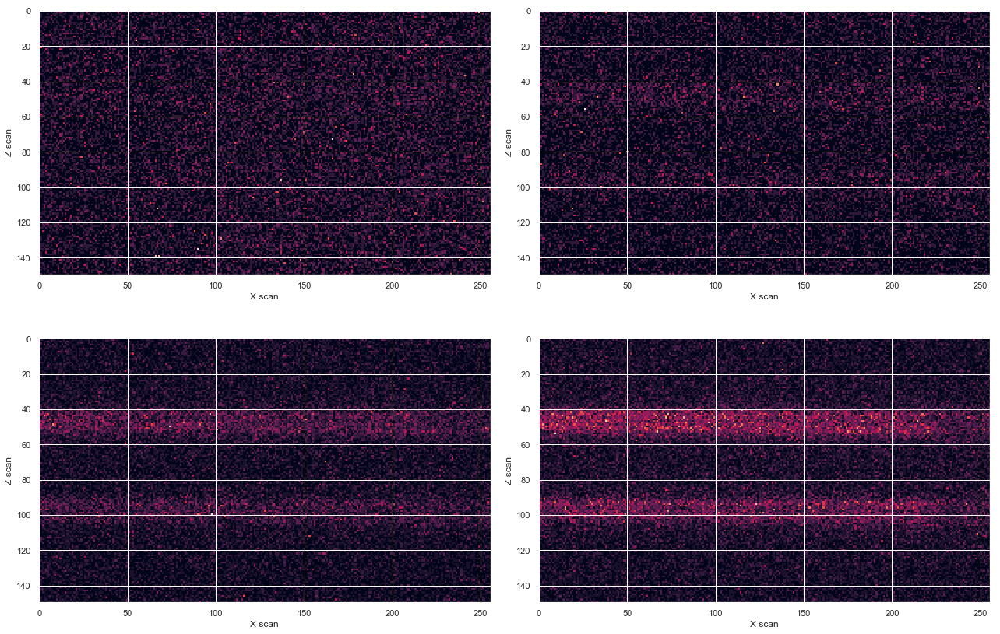

In [160]:
show_toms((tom10mW0, tom25mW0, tom50mW0, tom75mW0), nx = 2, ny =2, figsize=(18,12))

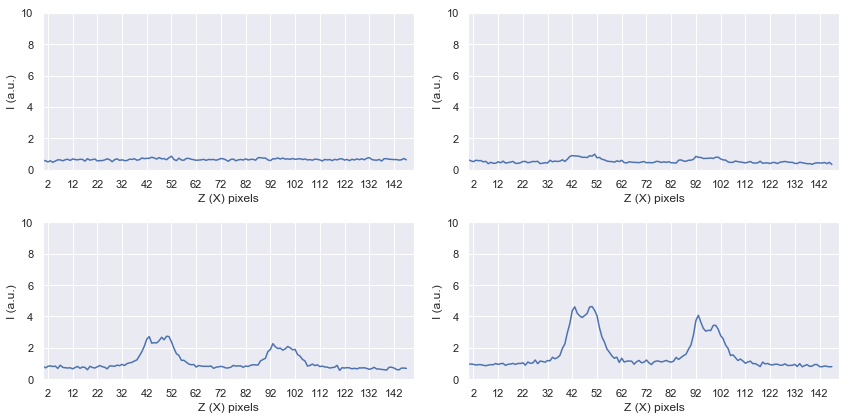

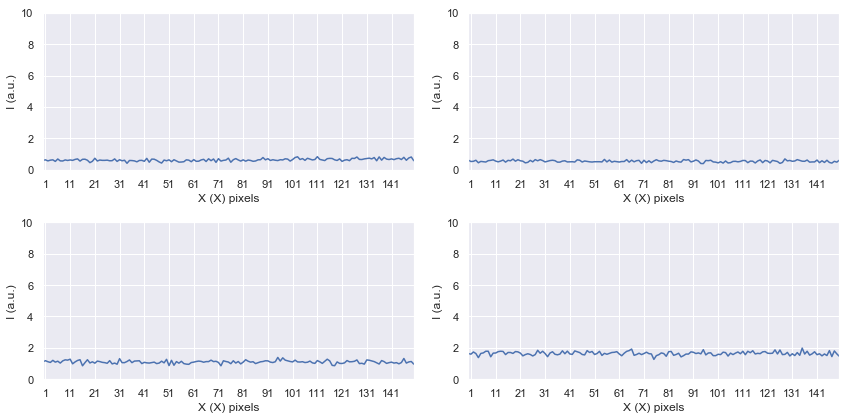

In [205]:
display_profiles((tom10mW0, tom25mW0, tom50mW0, tom75mW0), zrange=(0,150), yrange=(0,10), nx = 2, ny =2, figsize=(12,6))

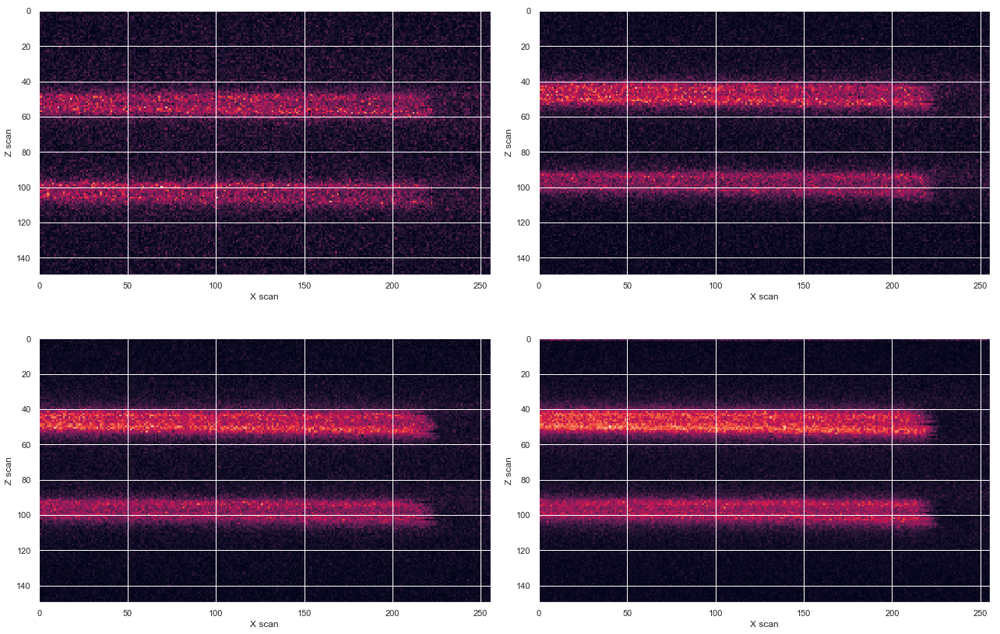

In [166]:
show_toms((tom100mW0, tom150mW0, tom200mW0, tom250mW0), nx = 2, ny =2, figsize=(18,12))

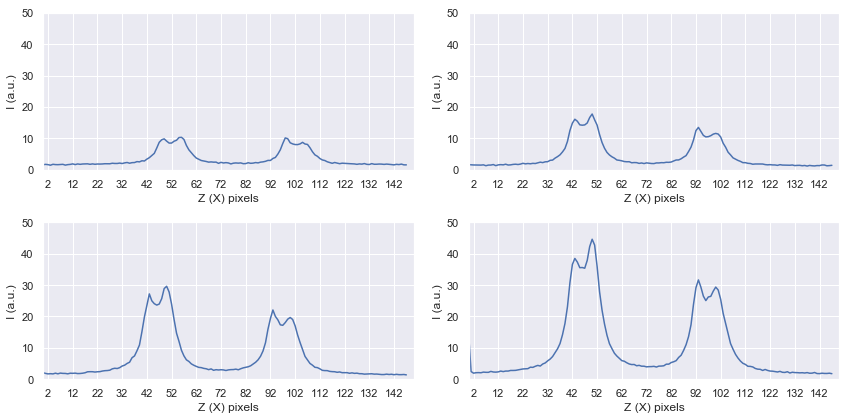

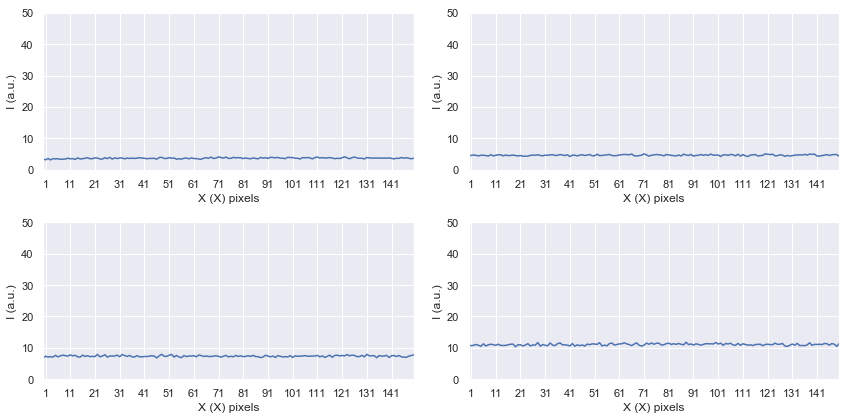

In [167]:
display_profiles((tom100mW0, tom150mW0, tom200mW0, tom250mW0), zrange=(0,150), yrange=(0,50), nx = 2, ny =2, figsize=(12,6))

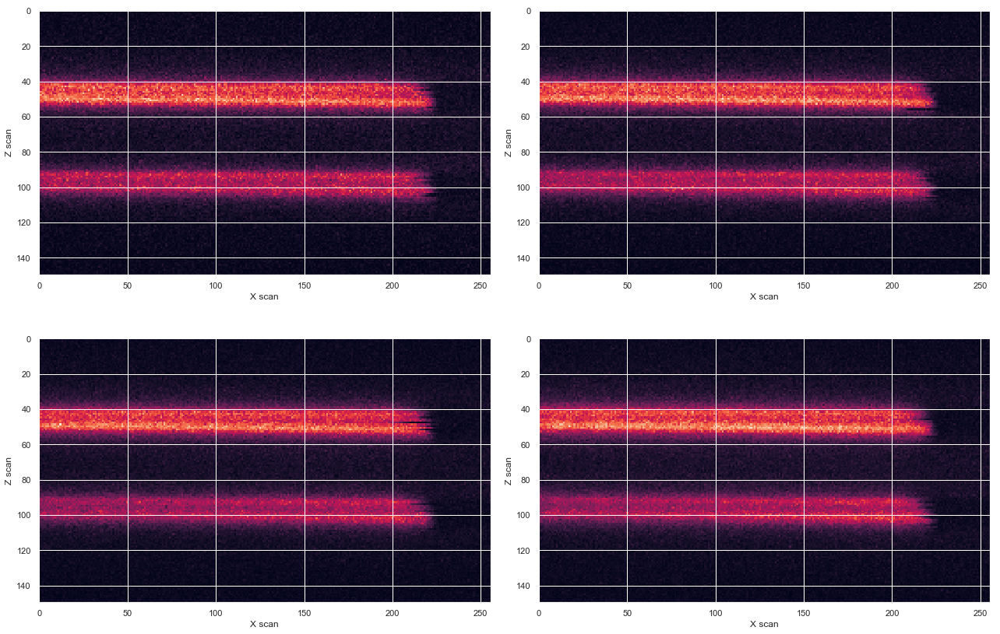

In [168]:
show_toms((tom300mW0, tom350mW0, tom400mW0, tom450mW0), nx = 2, ny =2, figsize=(18,12))

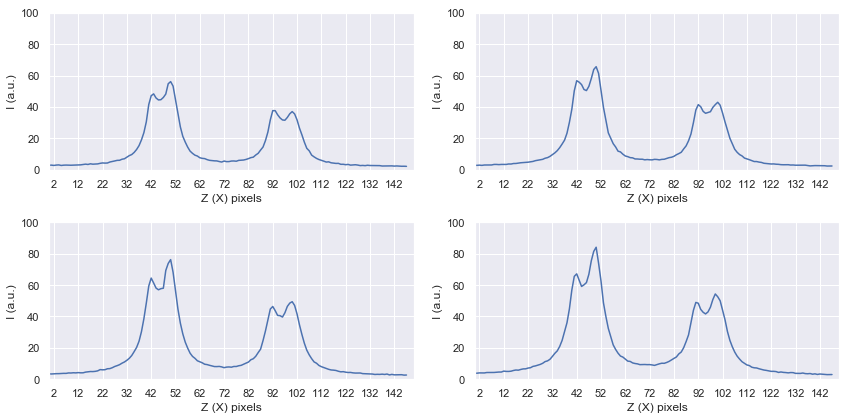

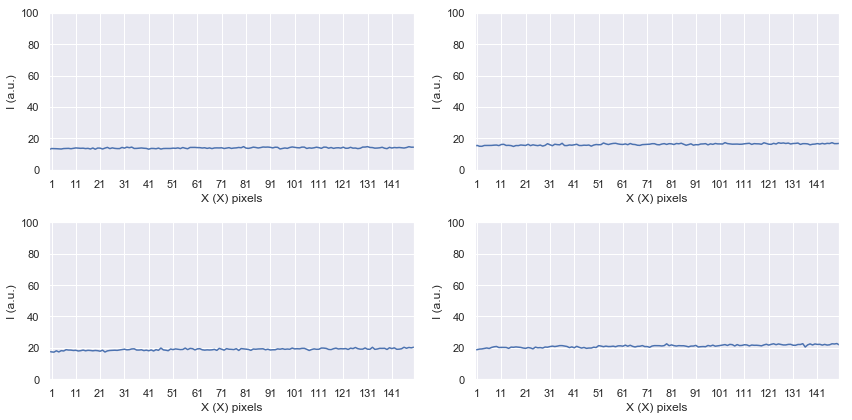

In [170]:
display_profiles((tom300mW0, tom350mW0, tom400mW0, tom450mW0), zrange=(0,150), yrange=(0,100), nx = 2, ny =2, figsize=(12,6))

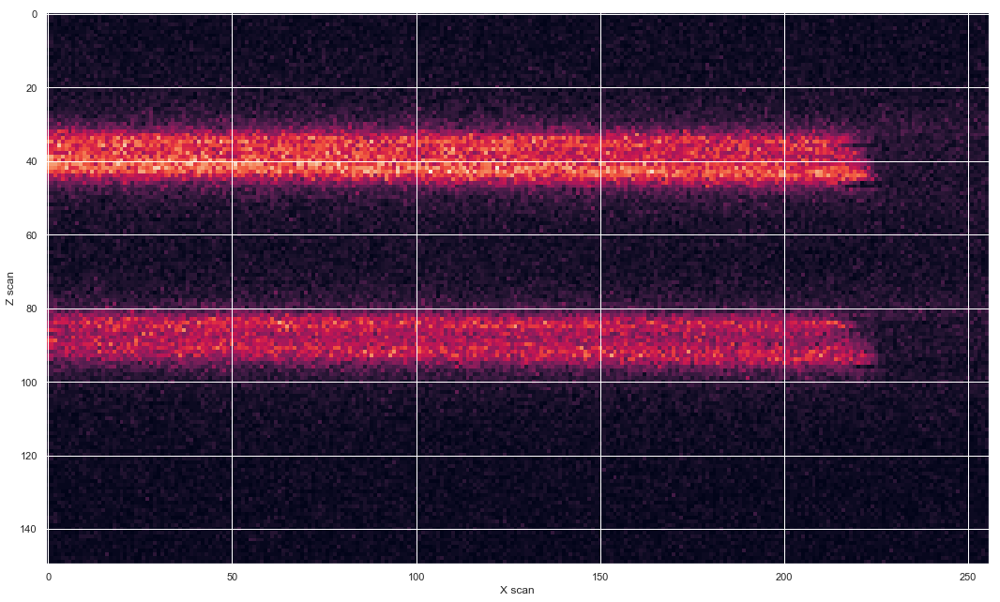

In [171]:
plot_TOM(tom750mW0, figsize=(18,12))

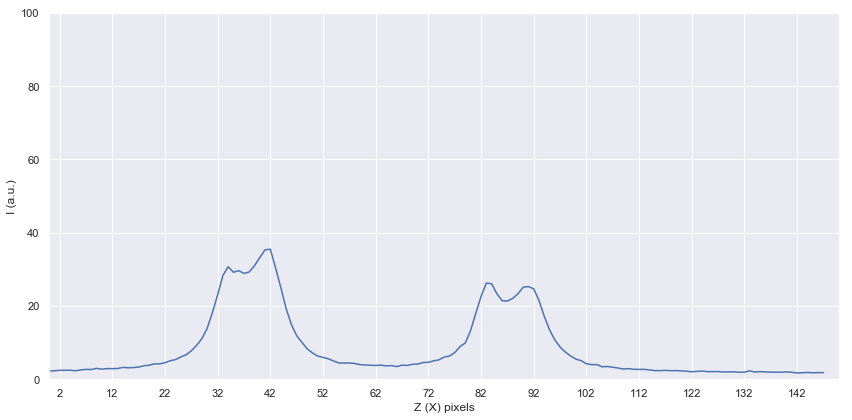

In [173]:
Z, ZV = get_profile(tom750mW0)
display_profile(tom750mW0, zrange=(0,150), yrange=(0,100))

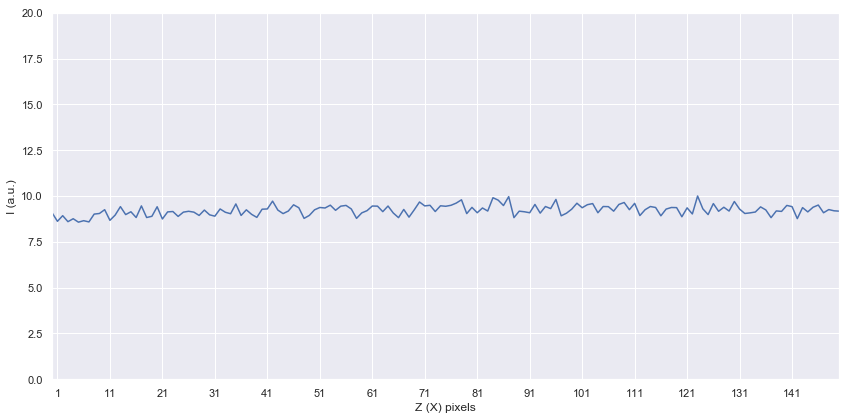

In [175]:
display_profile(tom750mW0.T, zrange=(0,150), yrange=(0,20))

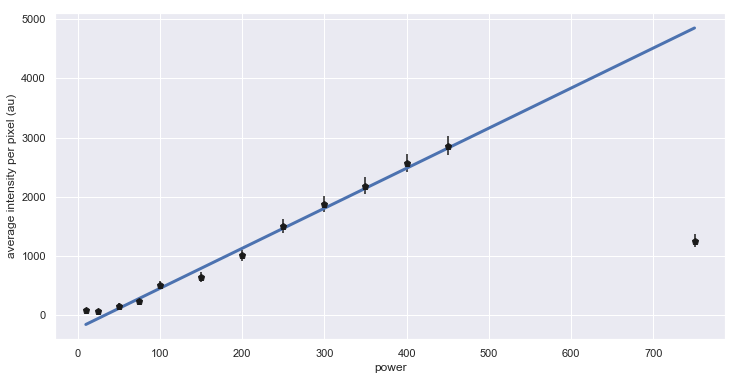

Fit function -->FitFunction(fn=<function fit.<locals>.<lambda> at 0x1a18dc7e18>, values=array([-220.81348601,    6.76105049]), errors=array([35.77865608,  0.23136404]), chi2=1.165975982606289, pvalue=0.3154015647784473, cov=array([[ 1.28011223e+03, -6.36062105e+00],
       [-6.36062105e+00,  5.35293186e-02]]))


In [226]:
I = tom_I((tom10mW0, tom25mW0, tom50mW0, tom75mW0,tom100mW0, tom150mW0, tom200mW0, tom250mW0,
         tom300mW0, tom350mW0, tom400mW0, tom450mW0,tom750mW0))
sigma = np.sqrt(I) * 3
sigma
fig = plt.figure(figsize=(12,6))
ax      = fig.add_subplot(1, 1, 1)
f    = fitf.fit(fitf.polynom, X[2:-1], I[2:-1], seed, sigma= sigma[2:-1])
plt.errorbar(X ,I, yerr = sigma, fmt="kp", ms=7, ls='none')
plt.plot(X, f.fn(X), lw=3)
plt.xlabel('power')
plt.ylabel('average intensity per pixel (au)')
plt.show()
print(f'Fit function -->{f}')

#### Except for the last point where the effect of PB kills the intensity, the dependence of intensity wit power seems lineal which is not consistent with the TPA formula. 

## LIVE

In [11]:
LIVE = get_live_dirs(path, sample='sample_5ba')

{'LIVE03_250_110-140': '/Users/jjgomezcadenas/Projects/Development/data/2Photon/sample_5ba/LIVE03_800nm_250,0mW_S1__256px_TPEF_13;43_110-140/jpeg', 'LIVE02_100_13;15': '/Users/jjgomezcadenas/Projects/Development/data/2Photon/sample_5ba/LIVE02_800nm_100,0mW_S1__256px_TPEF_13;15/jpeg', 'LIVE03_250_140-170': '/Users/jjgomezcadenas/Projects/Development/data/2Photon/sample_5ba/LIVE03_800nm_250,0mW_S1__256px_TPEF_13;45_140-170/jpeg', 'LIVE03_250_80-110': '/Users/jjgomezcadenas/Projects/Development/data/2Photon/sample_5ba/LIVE03_800nm_250,0mW_S1__256px_TPEF_13;41_80-110/jpeg', 'LIVE04_750_31-60': '/Users/jjgomezcadenas/Projects/Development/data/2Photon/sample_5ba/LIVE04_800nm_750,0mW_S1__256px_TPEF_14;04_31-60/jpeg', 'LIVE03_250_170-200': '/Users/jjgomezcadenas/Projects/Development/data/2Photon/sample_5ba/LIVE03_800nm_250,0mW_S1__256px_TPEF_13;50_170-200/jpeg', 'LIVE03_250_1-25': '/Users/jjgomezcadenas/Projects/Development/data/2Photon/sample_5ba/LIVE03_800nm_250,0mW_S1__256px_TPEF_13;35_1-25

In [12]:
LIVE.keys()

dict_keys(['LIVE03_250_110-140', 'LIVE02_100_13;15', 'LIVE03_250_140-170', 'LIVE03_250_80-110', 'LIVE04_750_31-60', 'LIVE03_250_170-200', 'LIVE03_250_1-25', 'LIVE04_750_1-30', 'LIVE03_250_25-50', 'LIVE02_100_13;21', 'LIVE02_100_13;19', 'LIVE02_100_13;26', 'LIVE02_100_13;17', 'LIVE04_750_61-90', 'LIVE03_250_50-80'])

### LIVE02 -- 100 mW

In [13]:
files = glob.glob(LIVE['LIVE02_100_13;15']+'/*.jpg')

In [14]:
sfiles = sort_files(files)

In [15]:
L02DF1 = load_LIVE_images(sfiles)

Loading files corresponding to shots ['shot1', 'shot2', 'shot3', 'shot4', 'shot5', 'shot6', 'shot7', 'shot8', 'shot9', 'shot10', 'shot11', 'shot12', 'shot13', 'shot14', 'shot15', 'shot16', 'shot17', 'shot18', 'shot19', 'shot20', 'shot21', 'shot22', 'shot23', 'shot24', 'shot25']


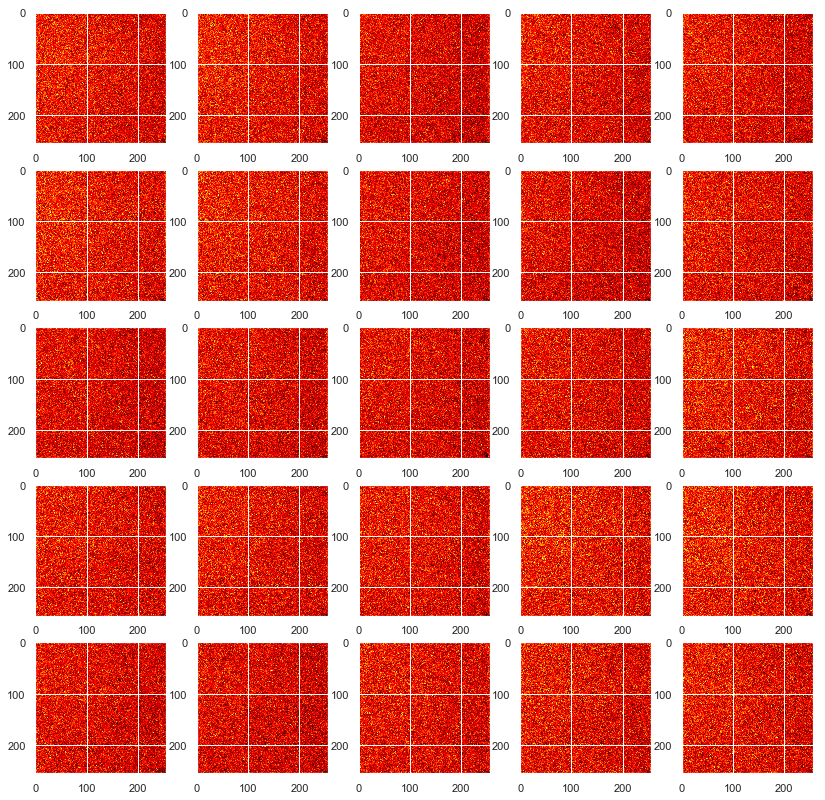

In [16]:
plot_LIVE_images(L02DF1, nx=5, ny=5, figsize=(14,14))

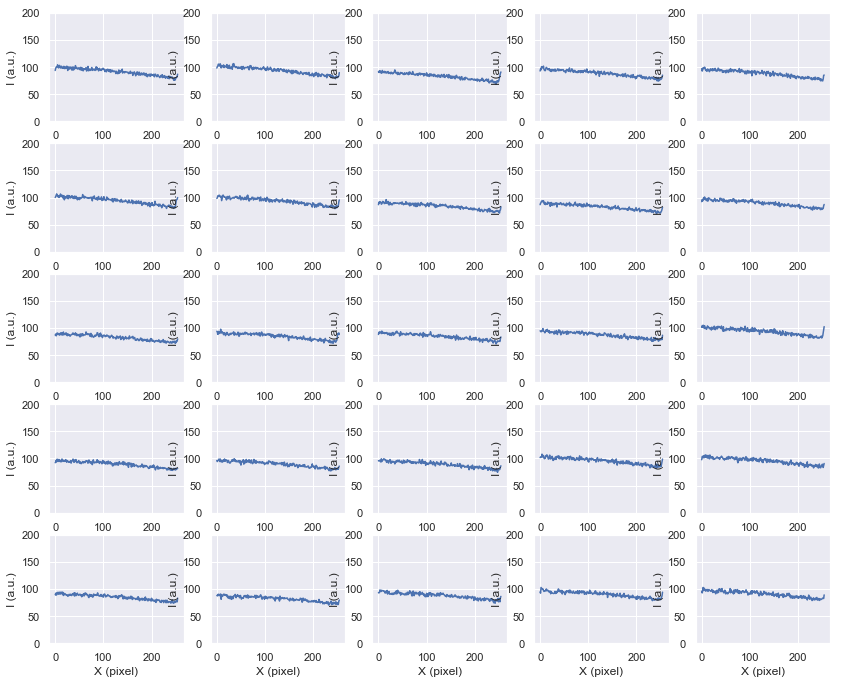

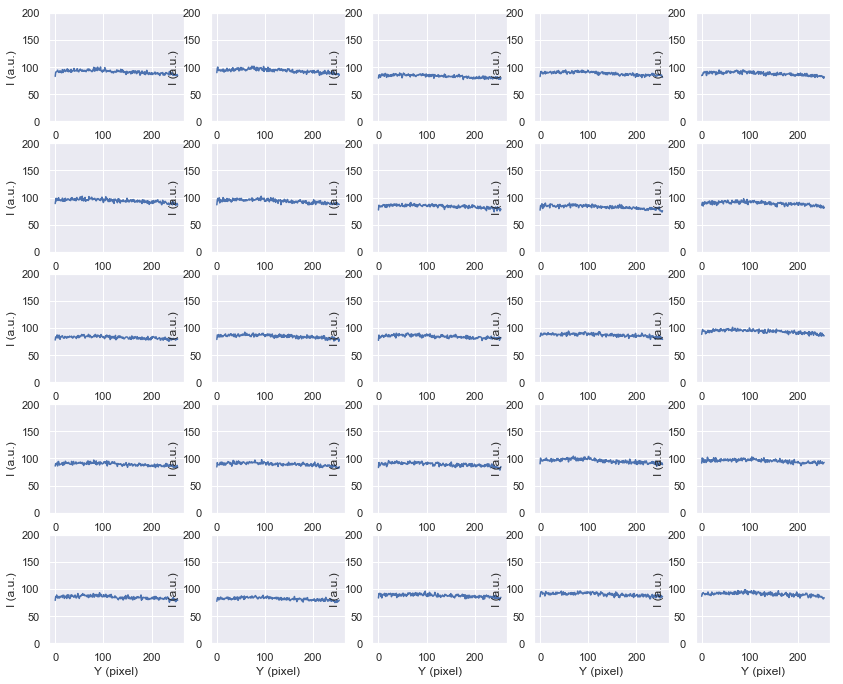

In [17]:
plot_LIVE_avg(L02DF1, xpixel =(0, 255), ypixel = (0,255), imax=200, nx=6, ny=5, figsize=(14,14))

In [18]:
avg_l02df1 = np.mean(avg_intensity(L02DF1))
std_l02df1 = np.std(avg_intensity(L02DF1))
print(f' average intensity per pixel = {avg_l02df1} +- {std_l02df1}')

 average intensity per pixel = 88.55580261230469 +- 4.149230593200255


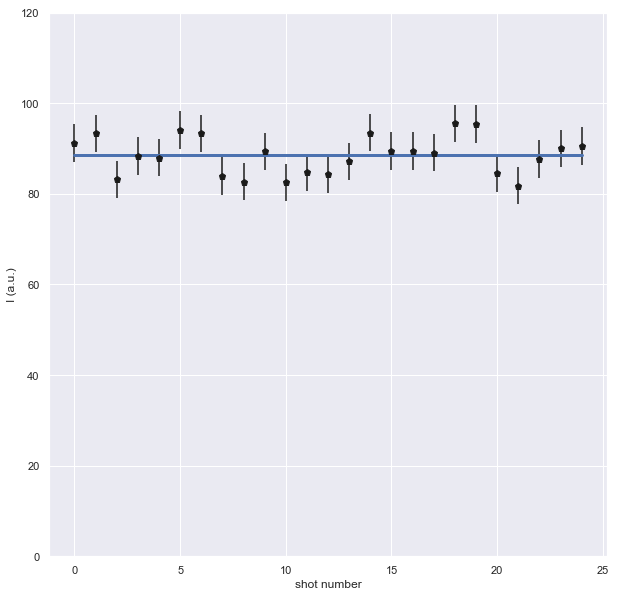

Fit function -->FitFunction(fn=<function fit.<locals>.<lambda> at 0x1a1997f378>, values=array([ 8.85558063e+01, -1.99293632e+08]), errors=array([1.5954806e+00, 4.9460448e+13]), chi2=1.0869565574438034, pvalue=0.35028529558258126, cov=array([[2.54555833e+00, 6.73990697e+13],
       [6.73990697e+13, 2.44633592e+27]]))


In [20]:
I = avg_intensity(L02DF1)
X = np.arange(len(I))
seed = expo_seed(X, I)
f    = fitf.fit(fitf.expo, X, I, seed, sigma= std_l02df1 * np.ones(len(I)))

imax=120
figsize=(10,10)
fig = plt.figure(figsize=figsize)
plt.errorbar(X,I, fmt="kp", yerr= std_l02df1  * np.ones(len(I)), ms=7, ls='none')
plt.plot(X, f.fn(X), lw=3)
plt.ylim(0,imax)
plt.xlabel('shot number')
plt.ylabel('I (a.u.)')
plt.show()
print(f'Fit function -->{f}')

 average intensity per pixel = 84.53041748046876 +- 4.935501101490805


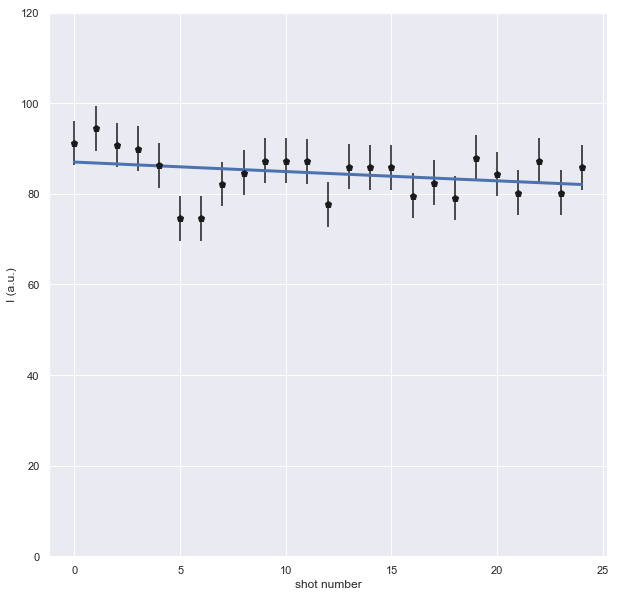

Fit function -->FitFunction(fn=<function fit.<locals>.<lambda> at 0x105d47730>, values=array([  87.0293897 , -409.66686897]), errors=array([  1.94272097, 271.81369486]), chi2=0.9899206344382764, pvalue=0.47437464120556183, cov=array([[3.77416476e+00, 4.50067007e+02],
       [4.50067007e+02, 7.38826847e+04]]))


In [22]:
avg_l02df2 = np.mean(avg_intensity(L02DF2))
std_l02df2 = np.std(avg_intensity(L02DF2))
print(f' average intensity per pixel = {avg_l02df2} +- {std_l02df2}')

I = avg_intensity(L02DF2)
X = np.arange(len(I))
seed = expo_seed(X, I)
f    = fitf.fit(fitf.expo, X, I, seed, sigma= std_l02df2 * np.ones(len(I)))

imax=120
figsize=(10,10)
fig = plt.figure(figsize=figsize)
plt.errorbar(X,I, fmt="kp", yerr= std_l02df2  * np.ones(len(I)), ms=7, ls='none')
plt.plot(X, f.fn(X), lw=3)
plt.ylim(0,imax)
plt.xlabel('shot number')
plt.ylabel('I (a.u.)')
plt.show()
print(f'Fit function -->{f}')

Loading files corresponding to shots ['shot1', 'shot2', 'shot3', 'shot4', 'shot5', 'shot6', 'shot7', 'shot8', 'shot9', 'shot10', 'shot11', 'shot12', 'shot13', 'shot14', 'shot15', 'shot16', 'shot17', 'shot18', 'shot19', 'shot20', 'shot21', 'shot22', 'shot23', 'shot24', 'shot25']


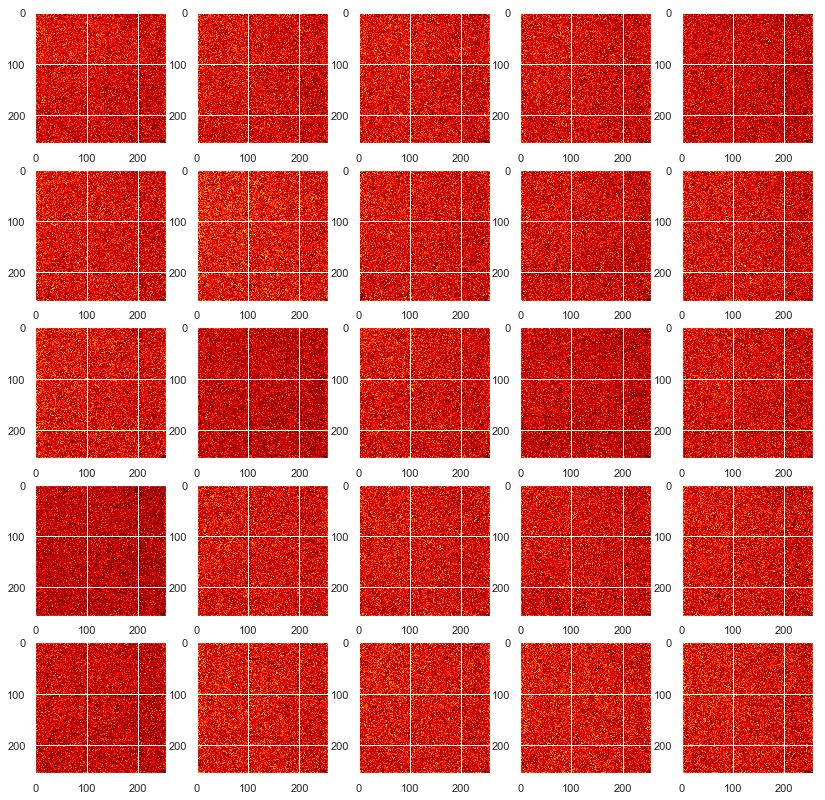

In [25]:
files = glob.glob(LIVE['LIVE02_100_13;19']+'/*.jpg')
sfiles = sort_files(files)
L02DF3 = load_LIVE_images(sfiles)
plot_LIVE_images(L02DF3, nx=5, ny=5, figsize=(14,14))

 average intensity per pixel = 82.49356323242188 +- 5.397468677414227


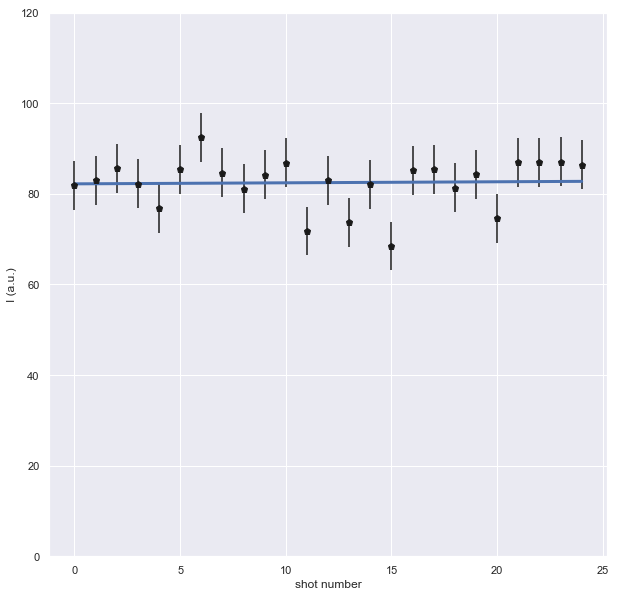

Fit function -->FitFunction(fn=<function fit.<locals>.<lambda> at 0x1a18382ea0>, values=array([  82.21906616, 3602.51390994]), errors=array([2.09250209e+00, 2.35126540e+04]), chi2=1.0859578530202525, pvalue=0.35147074067812273, cov=array([[4.37856500e+00, 4.21985746e+04],
       [4.21985746e+04, 5.52844897e+08]]))


In [29]:
avg_l02df3 = np.mean(avg_intensity(L02DF3))
std_l02df3 = np.std(avg_intensity(L02DF3))
print(f' average intensity per pixel = {avg_l02df3} +- {std_l02df3}')

I = avg_intensity(L02DF3)
X = np.arange(len(I))
seed = expo_seed(X, I)
f    = fitf.fit(fitf.expo, X, I, seed, sigma= std_l02df3 * np.ones(len(I)))

imax=120
figsize=(10,10)
fig = plt.figure(figsize=figsize)
plt.errorbar(X,I, fmt="kp", yerr= std_l02df3  * np.ones(len(I)), ms=7, ls='none')
plt.plot(X, f.fn(X), lw=3)
plt.ylim(0,imax)
plt.xlabel('shot number')
plt.ylabel('I (a.u.)')
plt.show()
print(f'Fit function -->{f}')

Loading files corresponding to shots ['shot1', 'shot2', 'shot3', 'shot4', 'shot5', 'shot6', 'shot7', 'shot8', 'shot9', 'shot10', 'shot11', 'shot12', 'shot13', 'shot14', 'shot15', 'shot16', 'shot17', 'shot18', 'shot19', 'shot20', 'shot21', 'shot22', 'shot23', 'shot24', 'shot25']


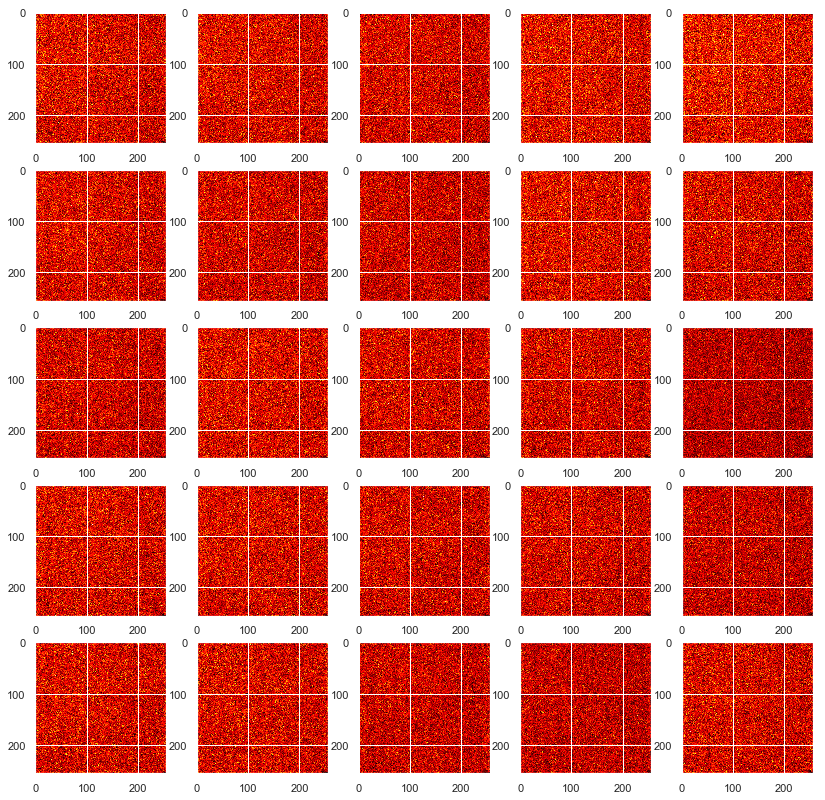

In [28]:
files = glob.glob(LIVE['LIVE02_100_13;21']+'/*.jpg')
sfiles = sort_files(files)
L02DF4 = load_LIVE_images(sfiles)
plot_LIVE_images(L02DF4, nx=5, ny=5, figsize=(14,14))

 average intensity per pixel = 79.76097290039063 +- 5.023993601755688


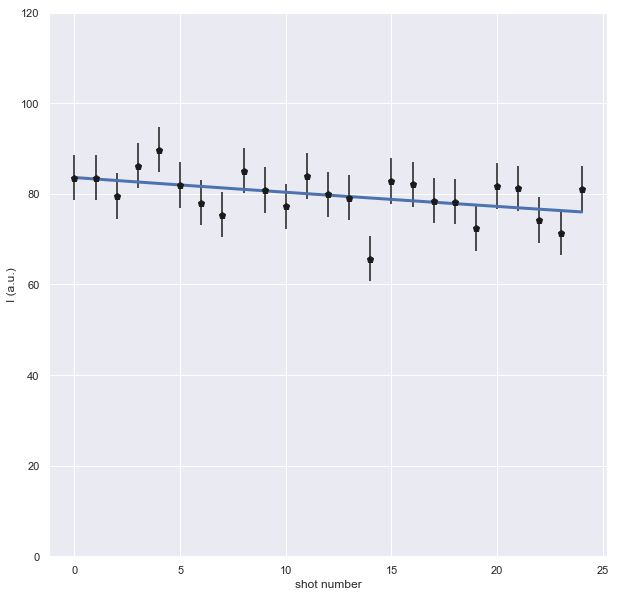

Fit function -->FitFunction(fn=<function fit.<locals>.<lambda> at 0x1a18a87510>, values=array([  83.61729685, -251.95299746]), errors=array([  1.99428142, 110.96246715]), chi2=0.8638436197730297, pvalue=0.6498367547826802, cov=array([[3.97715838e+00, 1.87931681e+02],
       [1.87931681e+02, 1.23126691e+04]]))


In [27]:
avg_l02df4 = np.mean(avg_intensity(L02DF4))
std_l02df4 = np.std(avg_intensity(L02DF4))
print(f' average intensity per pixel = {avg_l02df4} +- {std_l02df4}')

I = avg_intensity(L02DF4)
X = np.arange(len(I))
seed = expo_seed(X, I)
f    = fitf.fit(fitf.expo, X, I, seed, sigma= std_l02df4 * np.ones(len(I)))

imax=120
figsize=(10,10)
fig = plt.figure(figsize=figsize)
plt.errorbar(X,I, fmt="kp", yerr= std_l02df4  * np.ones(len(I)), ms=7, ls='none')
plt.plot(X, f.fn(X), lw=3)
plt.ylim(0,imax)
plt.xlabel('shot number')
plt.ylabel('I (a.u.)')
plt.show()
print(f'Fit function -->{f}')

Loading files corresponding to shots ['shot1', 'shot2', 'shot3', 'shot4', 'shot5', 'shot6', 'shot7', 'shot8', 'shot9', 'shot10', 'shot11', 'shot12', 'shot13', 'shot14', 'shot15', 'shot16', 'shot17', 'shot18', 'shot19', 'shot20', 'shot21', 'shot22', 'shot23', 'shot24', 'shot25']


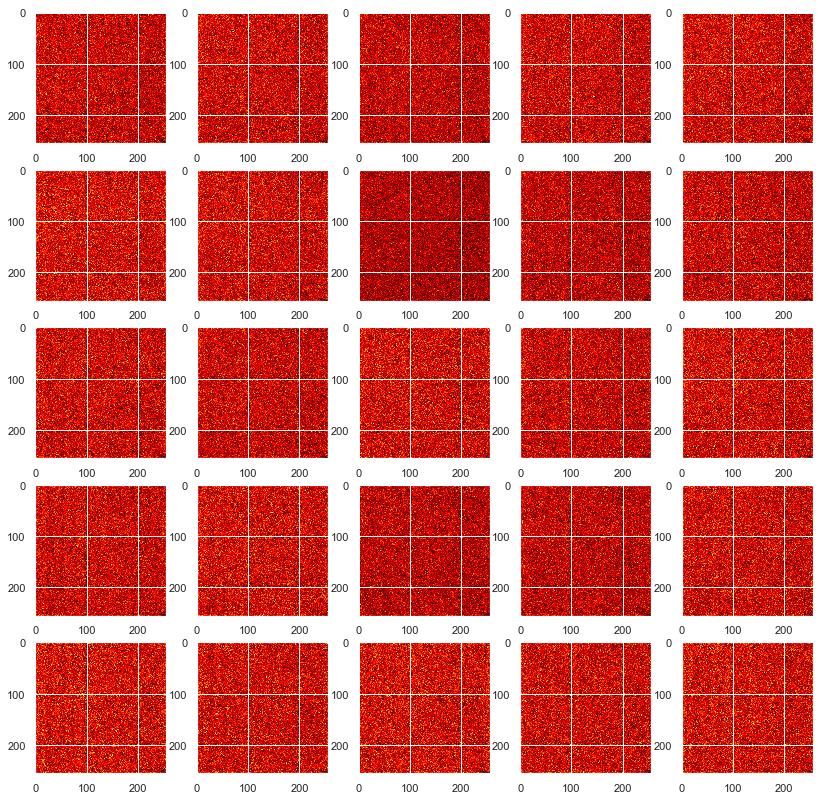

In [32]:
files = glob.glob(LIVE['LIVE02_100_13;26']+'/*.jpg')
sfiles = sort_files(files)
L02DF5 = load_LIVE_images(sfiles)
plot_LIVE_images(L02DF5, nx=5, ny=5, figsize=(14,14))

 average intensity per pixel = 77.2906884765625 +- 5.334745980159898


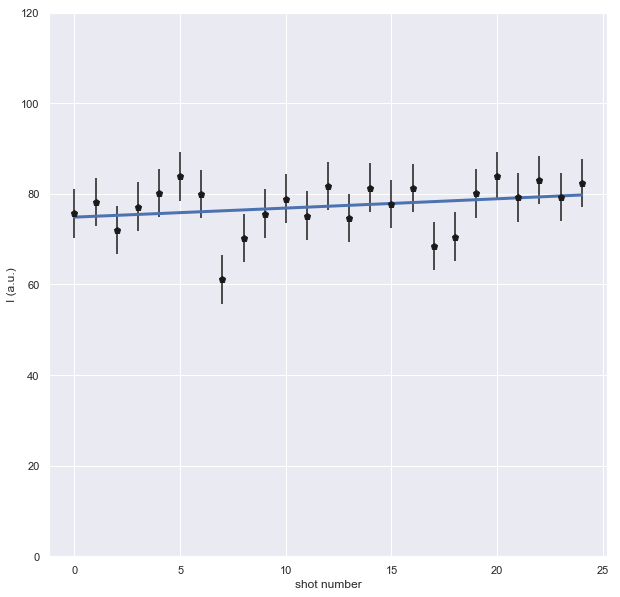

Fit function -->FitFunction(fn=<function fit.<locals>.<lambda> at 0x1a199b27b8>, values=array([ 74.87127113, 379.50217171]), errors=array([  2.04063721, 275.70756398]), chi2=1.005652876088539, pvalue=0.4532002771284392, cov=array([[4.16420020e+00, 4.85148348e+02],
       [4.85148348e+02, 7.60146608e+04]]))


In [31]:
avg_l02df5 = np.mean(avg_intensity(L02DF5))
std_l02df5 = np.std(avg_intensity(L02DF5))
print(f' average intensity per pixel = {avg_l02df5} +- {std_l02df5}')
I = avg_intensity(L02DF5)
X = np.arange(len(I))
seed = expo_seed(X, I)
f    = fitf.fit(fitf.expo, X, I, seed, sigma= std_l02df5 * np.ones(len(I)))

imax=120
figsize=(10,10)
fig = plt.figure(figsize=figsize)
plt.errorbar(X,I, fmt="kp", yerr= std_l02df5  * np.ones(len(I)), ms=7, ls='none')
plt.plot(X, f.fn(X), lw=3)
plt.ylim(0,imax)
plt.xlabel('shot number')
plt.ylabel('I (a.u.)')
plt.show()
print(f'Fit function -->{f}')

In [33]:
L02DF = L02DF1 + L02DF2 + L02DF3 + L02DF4 + L02DF5

 average intensity per pixel = 82.5262889404297 +- 6.322010794995256


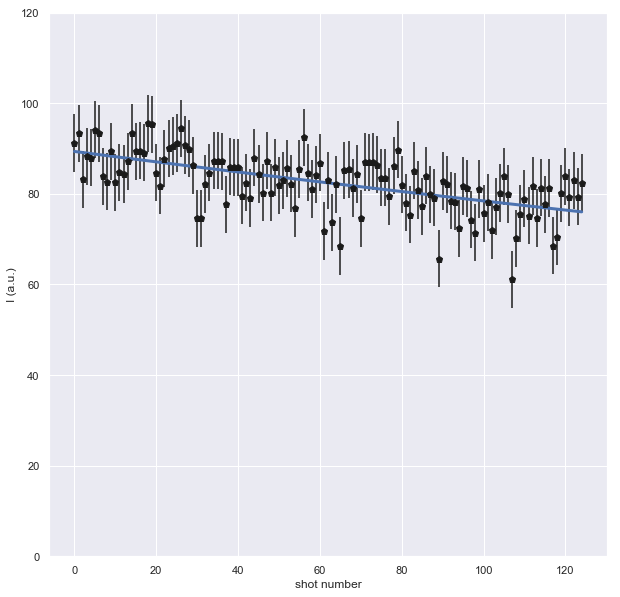

Fit function -->FitFunction(fn=<function fit.<locals>.<lambda> at 0x1a192f58c8>, values=array([  89.37031431, -767.51175581]), errors=array([  1.16903893, 112.01883757]), chi2=0.6350517026917162, pvalue=0.9994555820948782, cov=array([[1.36665202e+00, 1.11597803e+02],
       [1.11597803e+02, 1.25482200e+04]]))


In [35]:
avg_l02df = np.mean(avg_intensity(L02DF))
std_l02df = np.std(avg_intensity(L02DF))
print(f' average intensity per pixel = {avg_l02df} +- {std_l02df}')

I = avg_intensity(L02DF)
X = np.arange(len(I))
seed = expo_seed(X, I)
f    = fitf.fit(fitf.expo, X, I, seed, sigma= std_l02df * np.ones(len(I)))

imax=120
figsize=(10,10)
fig = plt.figure(figsize=figsize)
plt.errorbar(X,I, fmt="kp", yerr= std_l02df  * np.ones(len(I)), ms=7, ls='none')
plt.plot(X, f.fn(X), lw=3)
plt.ylim(0,imax)
plt.xlabel('shot number')
plt.ylabel('I (a.u.)')
plt.show()
print(f'Fit function -->{f}')


        Pulsed Laser:
        wavelength                =8.0e+02 nm
        photon energy             =1.6e+00 eV
        power                     =6.0e+01 mW
        repetition rate           =7.6e+01 kHz
        pulse width               =4.0e+02 fs
        energy per pulse          =4.6e+03 fJ
        energy per second         =6.0e+01 mJ
        photons per second        =2.4e+17 ph/second
        

        name                 = JMB
        NA                   =   0.5
        M                    =  20.0
        eff dichroic         =  0.70
        eff filter           =  1.00
        eff PMT              =  0.10
        Optical transmission =  0.96
        Filter  transmission =  0.70
        Total transmission   =  0.07
        

        w0                   =   0.5 micron
        zr                   =   1.0 micron
        DOF                  =   2.0 micron
        
 Diffraction limit transverse size of beam = 0.9760000000000002
pixel size = 3.5e-01 mum
time per pixel =97.6

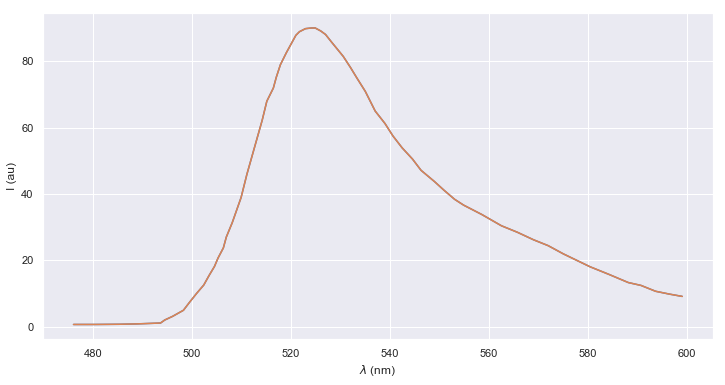

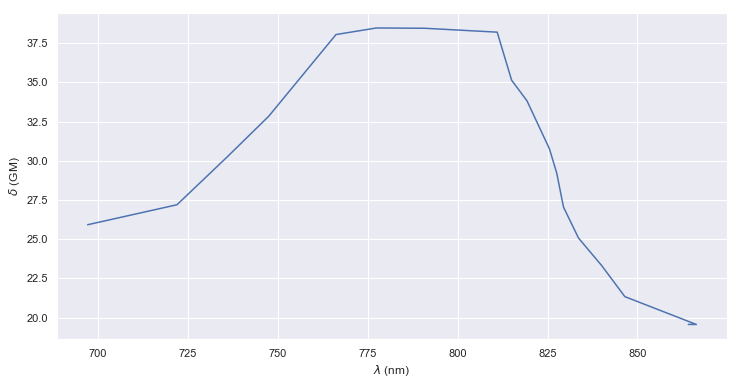

In [303]:
s2 = Setup(            setup_name             = 'Espinardo',
                        molecule_name          = 'FLUO3',
                        sample_name            = '5ba',
                        sample_concentration   = 1E+6/6 * nanomole/liter,
                        laser_lambda           = 800 * nm,
                        laser_power            = 100 * mW,
                        laser_eff              = 0.6,
                        laser_lambda_eff       = 1,
                        laser_f                = 76  * megahertz,
                        laser_tau              = 400 * femtosecond,
                        mc_name                = 'JMB',
                        mc_NA                  = 0.5,
                        mc_M                   = 20,
                        mc_eff_dic             = 0.7,
                        mc_eff_filt            = 1.0,
                        mc_eff_PMT             = 0.1,
                        n_pixels               = 256,
                        scan_length            = 90 * mum,
                        v_per_line             = 40)

In [304]:
avg_l02df = 89.7
F = s2.fluorescence()
nf = s2.photons_per_pixel()
pnm = s2.photons_per_pixel_per_molecule()
nd = s2.detected_photons_per_pixel()
IN = nd / avg_l02df
print(f' F = {F/us:5.1e}  photons/second')
print(f' nf = {nf:5.1e} photons/pixel (about 100 mus)')
print(f' nm = {pnm:5.1e} photons/pixel/molecule (about 100 mus)')
print(f' nd = {nd:5.1e} detected photons/pixel (about 100 mus)')
print(f' number of photons per count = {IN:5.1e} ')

 F = 3.5e+10  photons/second
 nf = 3.4e+06 photons/pixel (about 100 mus)
 nm = 2.1e+01 photons/pixel/molecule (about 100 mus)
 nd = 2.3e+05 detected photons/pixel (about 100 mus)
 number of photons per count = 2.6e+03 


In [248]:
v_per_line = 40 
n_pixels = 256
t_line = (1/v_per_line) * second
t_pixel = t_line/n_pixels
print(f'time per pixel ={t_pixel/mus} (mus)')


time per pixel =97.65625 (mus)


### LIVE03  --250 mW

In [96]:
LIVE.keys()

dict_keys(['LIVE03_250_110-140', 'LIVE02_100_13;15', 'LIVE03_250_140-170', 'LIVE03_250_80-110', 'LIVE04_750_31-60', 'LIVE03_250_170-200', 'LIVE03_250_1-25', 'LIVE04_750_1-30', 'LIVE03_250_25-50', 'LIVE02_100_13;21', 'LIVE02_100_13;19', 'LIVE02_100_13;26', 'LIVE02_100_13;17', 'LIVE04_750_61-90', 'LIVE03_250_50-80'])

Loading files corresponding to shots ['shot1', 'shot2', 'shot3', 'shot4', 'shot5', 'shot6', 'shot7', 'shot8', 'shot9', 'shot10', 'shot11', 'shot12', 'shot13', 'shot14', 'shot15', 'shot16', 'shot17', 'shot18', 'shot19', 'shot20', 'shot21', 'shot22', 'shot23', 'shot24', 'shot25', 'shot26', 'shot27', 'shot28', 'shot29', 'shot30']


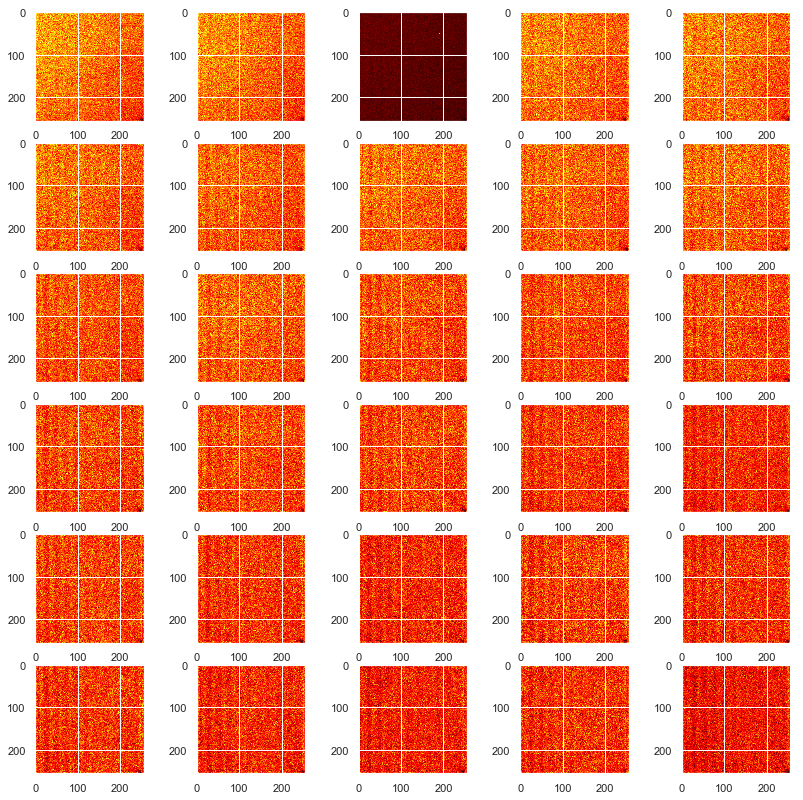

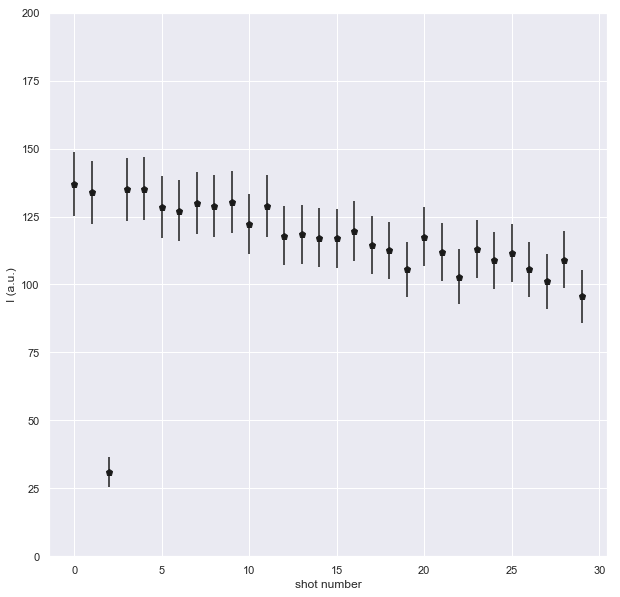

In [97]:
files = glob.glob(LIVE['LIVE03_250_1-25']+'/*.jpg')
sfiles = sort_files(files)
L03DF1 = load_LIVE_images(sfiles)
plot_LIVE_images(L03DF1, nx=6, ny=5, figsize=(14,14))
plot_avg_intensity(L03DF1, imax=200, figsize=(10,10))

 average intensity per pixel = 115.63079274495443 +- 19.14311539816059


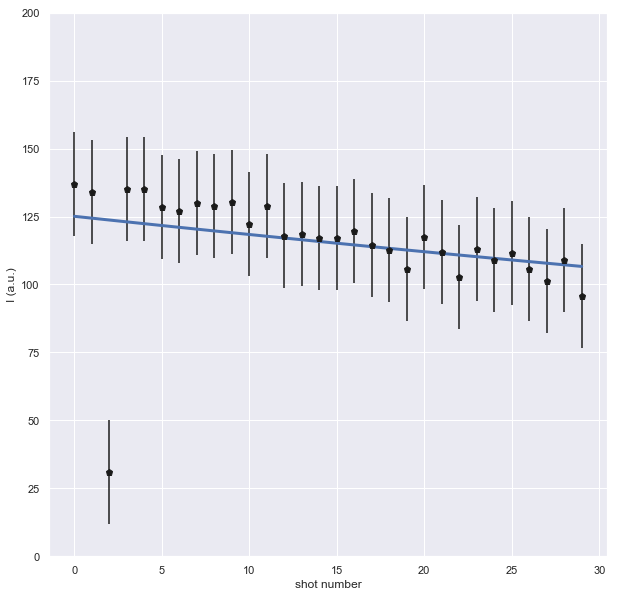

Fit function -->FitFunction(fn=<function fit.<locals>.<lambda> at 0x1a18b819d8>, values=array([ 125.08903373, -181.88679437]), errors=array([  7.07607725, 115.72810907]), chi2=0.9801593694323599, pvalue=0.4941563234924453, cov=array([[   50.07086929,   692.52396154],
       [  692.52396154, 13392.99522919]]))


In [99]:
avg_l03df1 = np.mean(avg_intensity(L03DF1))
std_l03df1 = np.std(avg_intensity(L03DF1))
print(f' average intensity per pixel = {avg_l03df1} +- {std_l03df1}')

I = avg_intensity(L03DF1)
X = np.arange(len(I))
seed = expo_seed(X, I)
f    = fitf.fit(fitf.expo, X, I, seed, sigma= std_l03df1 * np.ones(len(I)))

imax=200
figsize=(10,10)
fig = plt.figure(figsize=figsize)
plt.errorbar(X,I, fmt="kp", yerr= std_l03df1  * np.ones(len(I)), ms=7, ls='none')
plt.plot(X, f.fn(X), lw=3)
plt.ylim(0,imax)
plt.xlabel('shot number')
plt.ylabel('I (a.u.)')
plt.show()
print(f'Fit function -->{f}')

Loading files corresponding to shots ['shot1', 'shot2', 'shot3', 'shot4', 'shot5', 'shot6', 'shot7', 'shot8', 'shot9', 'shot10', 'shot11', 'shot12', 'shot13', 'shot14', 'shot15', 'shot16', 'shot17', 'shot18', 'shot19', 'shot20', 'shot21', 'shot22', 'shot23', 'shot24', 'shot25', 'shot26', 'shot27', 'shot28', 'shot29', 'shot30']


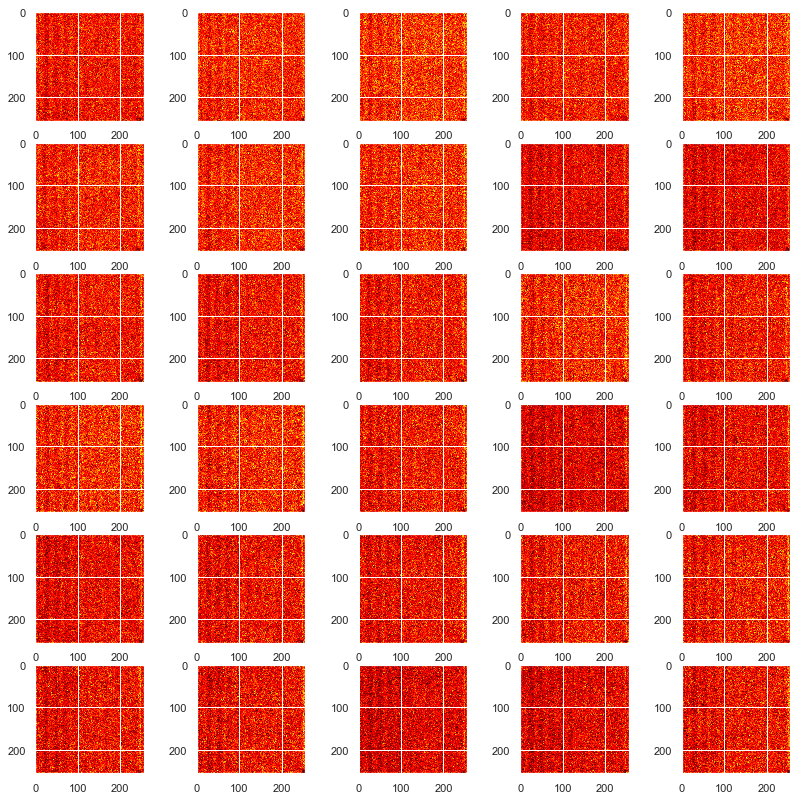

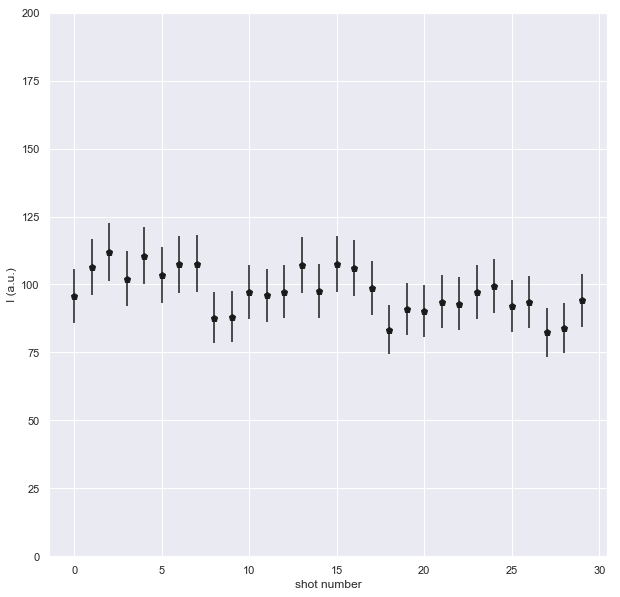

In [100]:
files = glob.glob(LIVE['LIVE03_250_25-50']+'/*.jpg')
sfiles = sort_files(files)
L03DF2 = load_LIVE_images(sfiles)
plot_LIVE_images(L03DF2, nx=6, ny=5, figsize=(14,14))
plot_avg_intensity(L03DF2, imax=200, figsize=(10,10))

 average intensity per pixel = 97.4453857421875 +- 8.122457704750119


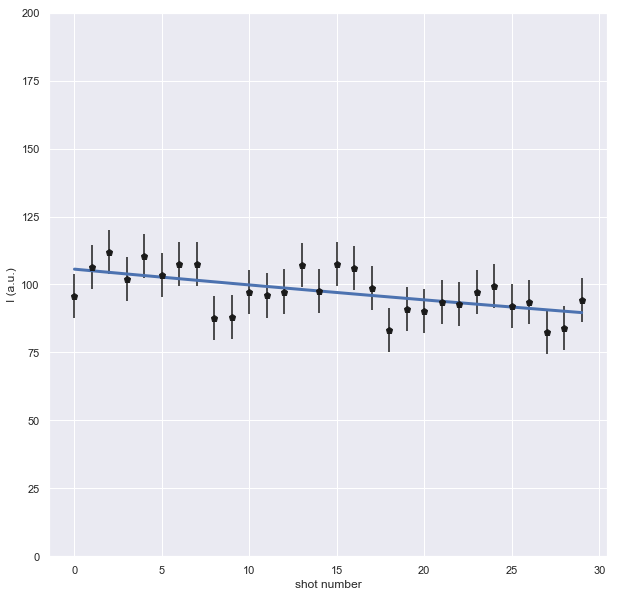

Fit function -->FitFunction(fn=<function fit.<locals>.<lambda> at 0x1a18b6e400>, values=array([ 105.64911862, -176.77376234]), errors=array([ 3.00554825, 55.03536813]), chi2=0.7006675057516939, pvalue=0.8779640485015517, cov=array([[   9.03332027,  139.8213278 ],
       [ 139.8213278 , 3028.89174506]]))


In [101]:
avg_l03df2 = np.mean(avg_intensity(L03DF2))
std_l03df2 = np.std(avg_intensity(L03DF2))
print(f' average intensity per pixel = {avg_l03df2} +- {std_l03df2}')

I = avg_intensity(L03DF2)
X = np.arange(len(I))
seed = expo_seed(X, I)
f    = fitf.fit(fitf.expo, X, I, seed, sigma= std_l03df2 * np.ones(len(I)))

imax=200
figsize=(10,10)
fig = plt.figure(figsize=figsize)
plt.errorbar(X,I, fmt="kp", yerr= std_l03df2  * np.ones(len(I)), ms=7, ls='none')
plt.plot(X, f.fn(X), lw=3)
plt.ylim(0,imax)
plt.xlabel('shot number')
plt.ylabel('I (a.u.)')
plt.show()
print(f'Fit function -->{f}')

Loading files corresponding to shots ['shot1', 'shot2', 'shot3', 'shot4', 'shot5', 'shot6', 'shot7', 'shot8', 'shot9', 'shot10', 'shot11', 'shot12', 'shot13', 'shot14', 'shot15', 'shot16', 'shot17', 'shot18', 'shot19', 'shot20', 'shot21', 'shot22', 'shot23', 'shot24', 'shot25', 'shot26', 'shot27', 'shot28', 'shot29', 'shot30']


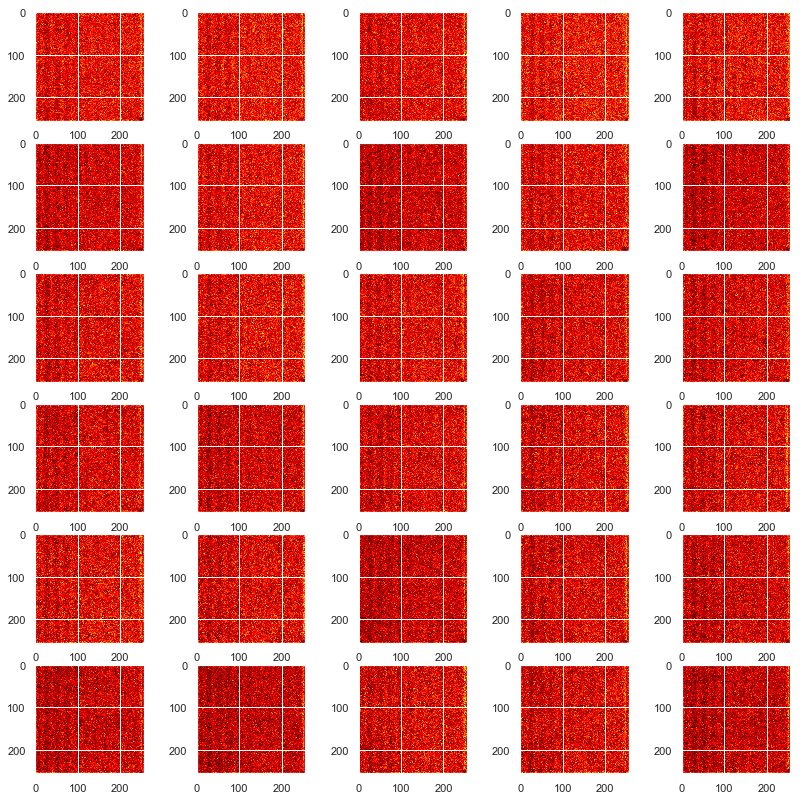

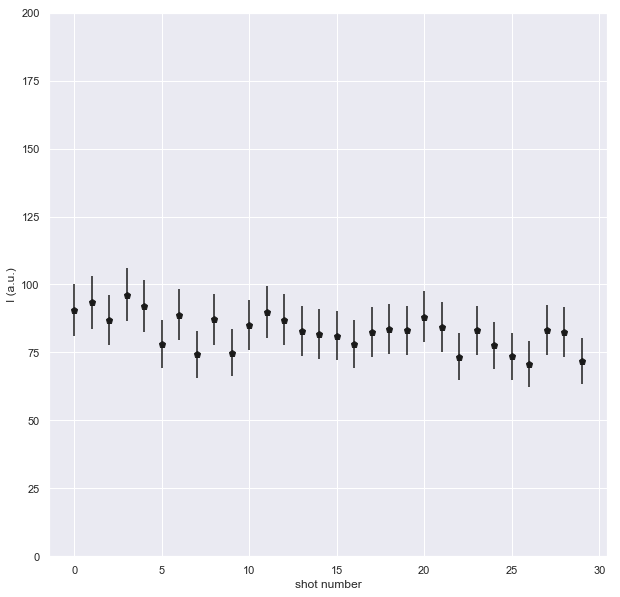

In [103]:
files = glob.glob(LIVE['LIVE03_250_50-80']+'/*.jpg')
sfiles = sort_files(files)
L03DF3 = load_LIVE_images(sfiles)
plot_LIVE_images(L03DF3, nx=6, ny=5, figsize=(14,14))
plot_avg_intensity(L03DF3, imax=200, figsize=(10,10))

 average intensity per pixel = 82.88724721272787 +- 6.5254385103568024


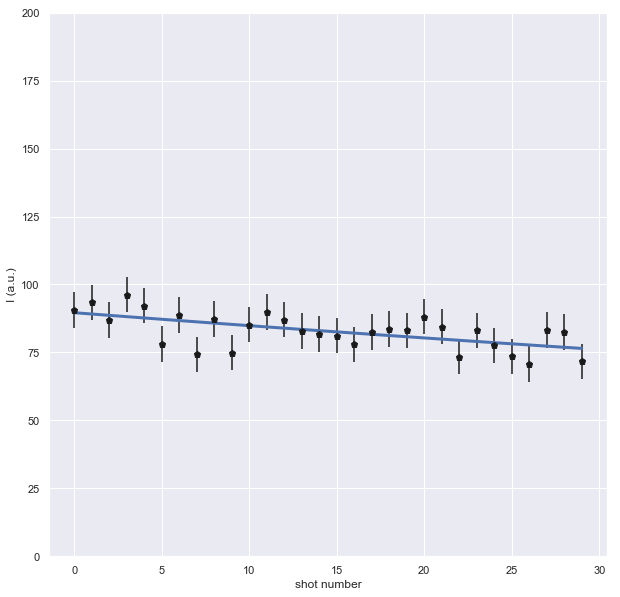

Fit function -->FitFunction(fn=<function fit.<locals>.<lambda> at 0x1a198d1488>, values=array([  89.62195673, -182.98386695]), errors=array([ 2.41155176, 55.69047795]), chi2=0.6863263464741596, pvalue=0.8913027099351726, cov=array([[   5.81558187,  113.5849367 ],
       [ 113.5849367 , 3101.42933415]]))


In [104]:
avg_l03df3 = np.mean(avg_intensity(L03DF3))
std_l03df3 = np.std(avg_intensity(L03DF3))
print(f' average intensity per pixel = {avg_l03df3} +- {std_l03df3}')

I = avg_intensity(L03DF3)
X = np.arange(len(I))
seed = expo_seed(X, I)
f    = fitf.fit(fitf.expo, X, I, seed, sigma= std_l03df3 * np.ones(len(I)))

imax=200
figsize=(10,10)
fig = plt.figure(figsize=figsize)
plt.errorbar(X,I, fmt="kp", yerr= std_l03df3  * np.ones(len(I)), ms=7, ls='none')
plt.plot(X, f.fn(X), lw=3)
plt.ylim(0,imax)
plt.xlabel('shot number')
plt.ylabel('I (a.u.)')
plt.show()
print(f'Fit function -->{f}')

Loading files corresponding to shots ['shot1', 'shot2', 'shot3', 'shot4', 'shot5', 'shot6', 'shot7', 'shot8', 'shot9', 'shot10', 'shot11', 'shot12', 'shot13', 'shot14', 'shot15', 'shot16', 'shot17', 'shot18', 'shot19', 'shot20', 'shot21', 'shot22', 'shot23', 'shot24', 'shot25', 'shot26', 'shot27', 'shot28', 'shot29', 'shot30']


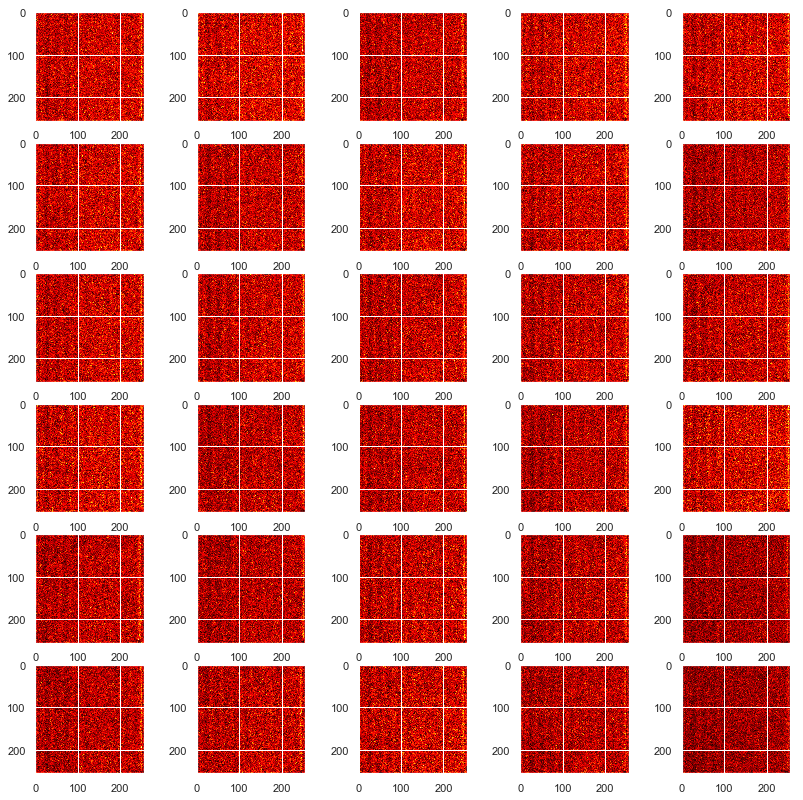

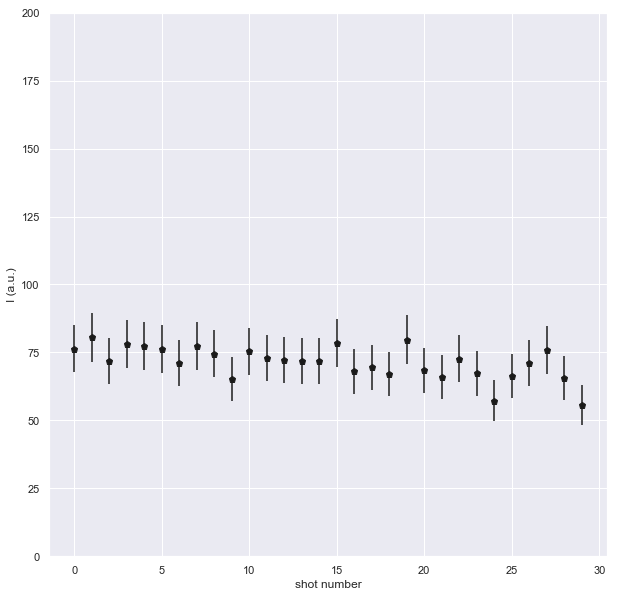

In [105]:
files = glob.glob(LIVE['LIVE03_250_80-110']+'/*.jpg')
sfiles = sort_files(files)
L03DF4 = load_LIVE_images(sfiles)
plot_LIVE_images(L03DF4, nx=6, ny=5, figsize=(14,14))
plot_avg_intensity(L03DF4, imax=200, figsize=(10,10))

 average intensity per pixel = 71.40011088053386 +- 5.926539501773391


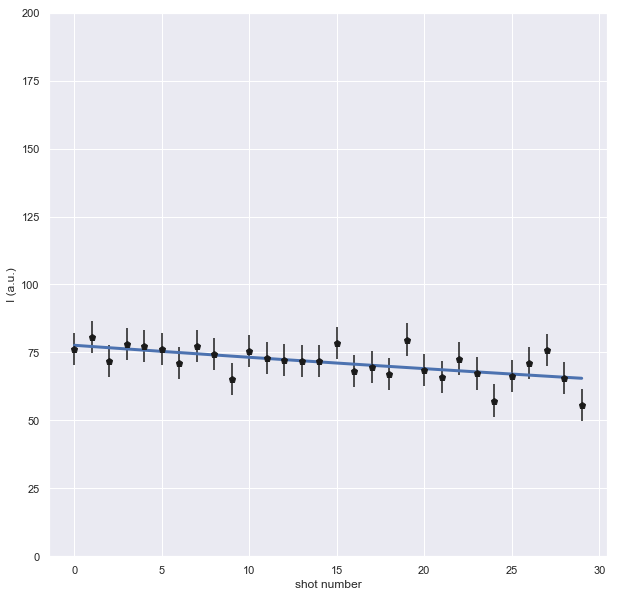

Fit function -->FitFunction(fn=<function fit.<locals>.<lambda> at 0x1a19a6b400>, values=array([  77.63648046, -170.55352967]), errors=array([ 2.19597221, 51.02210953]), chi2=0.6685949373049228, pvalue=0.906532591640462, cov=array([[   4.82229393,   94.6541927 ],
       [  94.6541927 , 2603.25566134]]))


In [107]:
avg_l03df4 = np.mean(avg_intensity(L03DF4))
std_l03df4 = np.std(avg_intensity(L03DF4))
print(f' average intensity per pixel = {avg_l03df4} +- {std_l03df4}')

I = avg_intensity(L03DF4)
X = np.arange(len(I))
seed = expo_seed(X, I)
f    = fitf.fit(fitf.expo, X, I, seed, sigma= std_l03df4 * np.ones(len(I)))

imax=200
figsize=(10,10)
fig = plt.figure(figsize=figsize)
plt.errorbar(X,I, fmt="kp", yerr= std_l03df4  * np.ones(len(I)), ms=7, ls='none')
plt.plot(X, f.fn(X), lw=3)
plt.ylim(0,imax)
plt.xlabel('shot number')
plt.ylabel('I (a.u.)')
plt.show()
print(f'Fit function -->{f}')

Loading files corresponding to shots ['shot1', 'shot2', 'shot3', 'shot4', 'shot5', 'shot6', 'shot7', 'shot8', 'shot9', 'shot10', 'shot11', 'shot12', 'shot13', 'shot14', 'shot15', 'shot16', 'shot17', 'shot18', 'shot19', 'shot20', 'shot21', 'shot22', 'shot23', 'shot24', 'shot25', 'shot26', 'shot27', 'shot28', 'shot29', 'shot30']


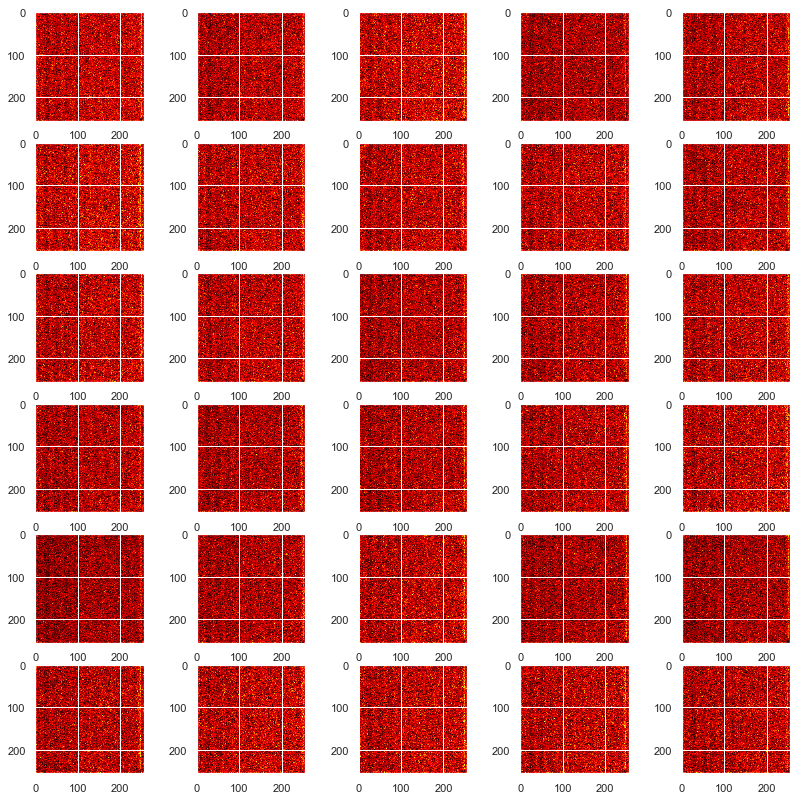

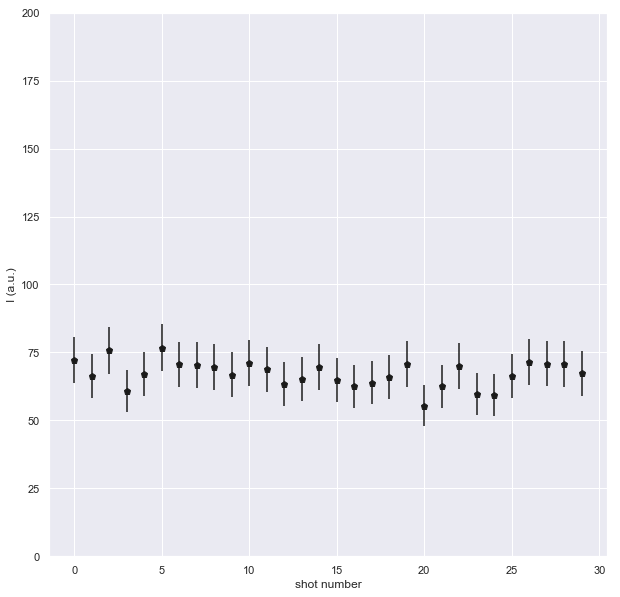

In [108]:
files = glob.glob(LIVE['LIVE03_250_110-140']+'/*.jpg')
sfiles = sort_files(files)
L03DF5 = load_LIVE_images(sfiles)
plot_LIVE_images(L03DF5, nx=6, ny=5, figsize=(14,14))
plot_avg_intensity(L03DF5, imax=200, figsize=(10,10))

 average intensity per pixel = 67.20566965738932 +- 4.771514109330841


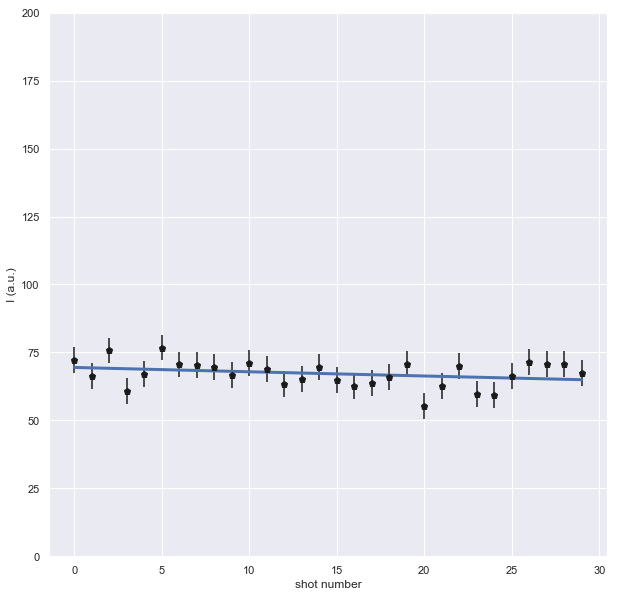

Fit function -->FitFunction(fn=<function fit.<locals>.<lambda> at 0x1a19aa47b8>, values=array([  69.48442589, -432.19969618]), errors=array([  1.72666876, 279.73027949]), chi2=0.9877878101598601, pvalue=0.48267375579144745, cov=array([[2.98138502e+00, 4.12110725e+02],
       [4.12110725e+02, 7.82490293e+04]]))


In [109]:
avg_l03df5 = np.mean(avg_intensity(L03DF5))
std_l03df5 = np.std(avg_intensity(L03DF5))
print(f' average intensity per pixel = {avg_l03df5} +- {std_l03df5}')

I = avg_intensity(L03DF5)
X = np.arange(len(I))
seed = expo_seed(X, I)
f    = fitf.fit(fitf.expo, X, I, seed, sigma= std_l03df5 * np.ones(len(I)))

imax=200
figsize=(10,10)
fig = plt.figure(figsize=figsize)
plt.errorbar(X,I, fmt="kp", yerr= std_l03df5  * np.ones(len(I)), ms=7, ls='none')
plt.plot(X, f.fn(X), lw=3)
plt.ylim(0,imax)
plt.xlabel('shot number')
plt.ylabel('I (a.u.)')
plt.show()
print(f'Fit function -->{f}')

Loading files corresponding to shots ['shot1', 'shot2', 'shot3', 'shot4', 'shot5', 'shot6', 'shot7', 'shot8', 'shot9', 'shot10', 'shot11', 'shot12', 'shot13', 'shot14', 'shot15', 'shot16', 'shot17', 'shot18', 'shot19', 'shot20', 'shot21', 'shot22', 'shot23', 'shot24', 'shot25', 'shot26', 'shot27', 'shot28', 'shot29', 'shot30']


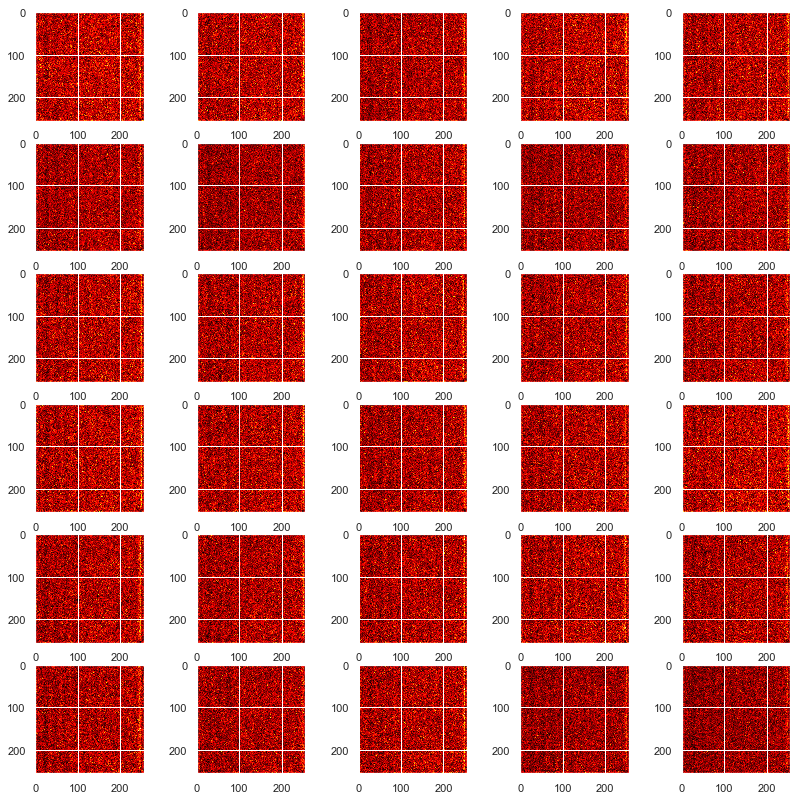

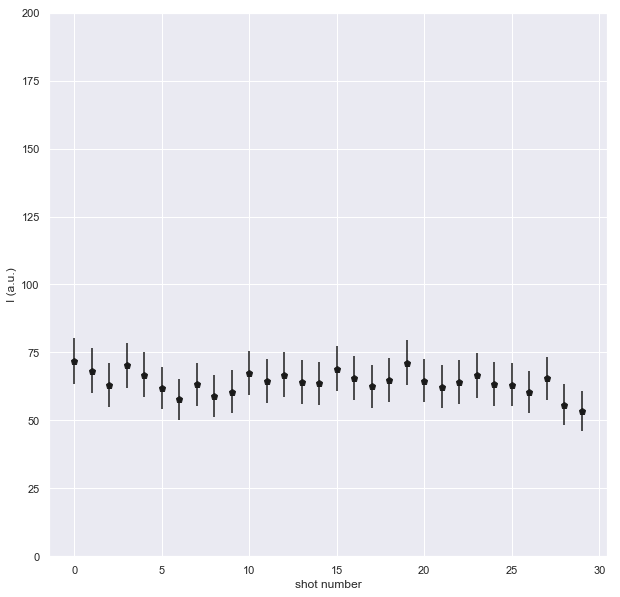

In [110]:
files = glob.glob(LIVE['LIVE03_250_140-170']+'/*.jpg')
sfiles = sort_files(files)
L03DF6 = load_LIVE_images(sfiles)
plot_LIVE_images(L03DF6, nx=6, ny=5, figsize=(14,14))
plot_avg_intensity(L03DF6, imax=200, figsize=(10,10))

 average intensity per pixel = 64.09546152750652 +- 4.164960258522278


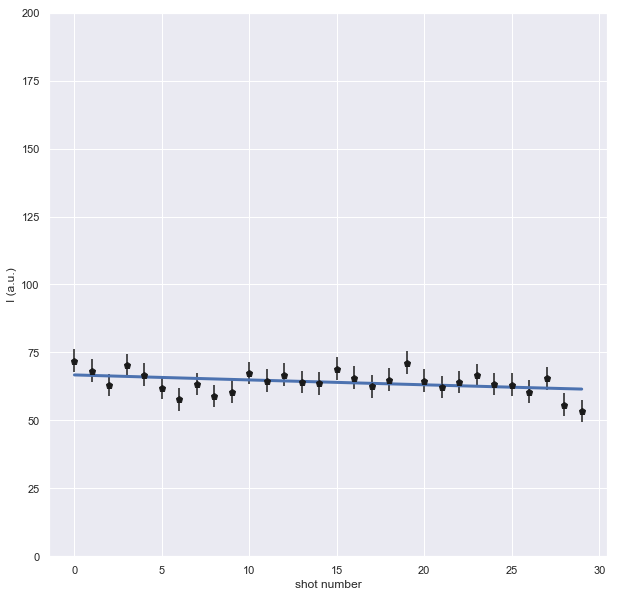

Fit function -->FitFunction(fn=<function fit.<locals>.<lambda> at 0x1a1bd580d0>, values=array([  66.73396857, -356.8635659 ]), errors=array([  1.51214364, 174.63615986]), chi2=0.9207146528241007, pvalue=0.5851354924025663, cov=array([[2.28657839e+00, 2.25012159e+02],
       [2.25012159e+02, 3.04977883e+04]]))


In [115]:
avg_l03df6 = np.mean(avg_intensity(L03DF6))
std_l03df6 = np.std(avg_intensity(L03DF6))
print(f' average intensity per pixel = {avg_l03df6} +- {std_l03df6}')

I = avg_intensity(L03DF6)
X = np.arange(len(I))
seed = expo_seed(X, I)
f    = fitf.fit(fitf.expo, X, I, seed, sigma= std_l03df6 * np.ones(len(I)))

imax=200
figsize=(10,10)
fig = plt.figure(figsize=figsize)
plt.errorbar(X,I, fmt="kp", yerr= std_l03df6  * np.ones(len(I)), ms=7, ls='none')
plt.plot(X, f.fn(X), lw=3)
plt.ylim(0,imax)
plt.xlabel('shot number')
plt.ylabel('I (a.u.)')
plt.show()
print(f'Fit function -->{f}')

Loading files corresponding to shots ['shot1', 'shot2', 'shot3', 'shot4', 'shot5', 'shot6', 'shot7', 'shot8', 'shot9', 'shot10', 'shot11', 'shot12', 'shot13', 'shot14', 'shot15', 'shot16', 'shot17', 'shot18', 'shot19', 'shot20', 'shot21', 'shot22', 'shot23', 'shot24', 'shot25', 'shot26', 'shot27', 'shot28', 'shot29', 'shot30']


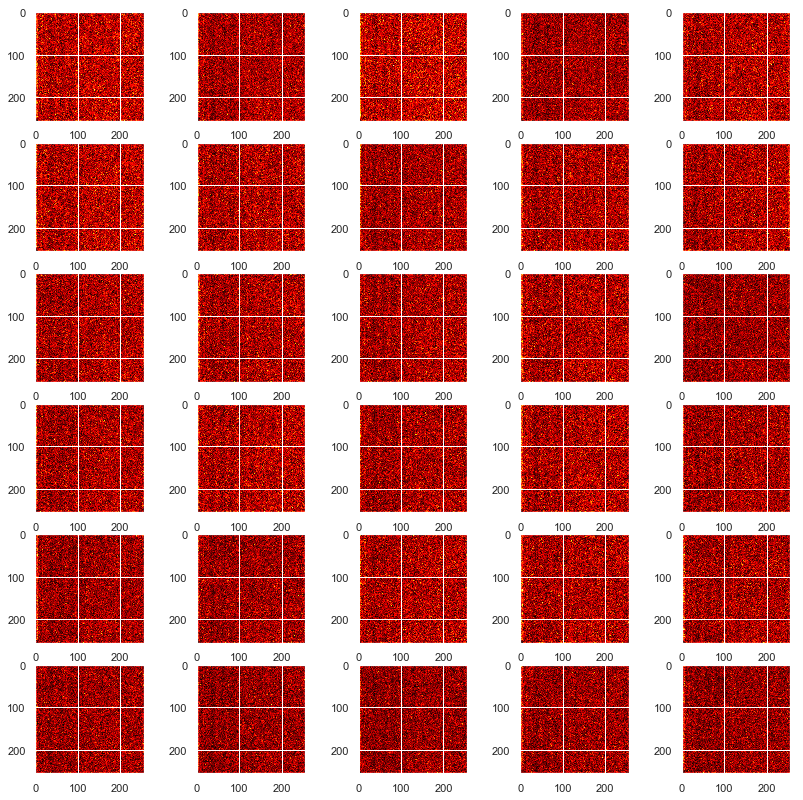

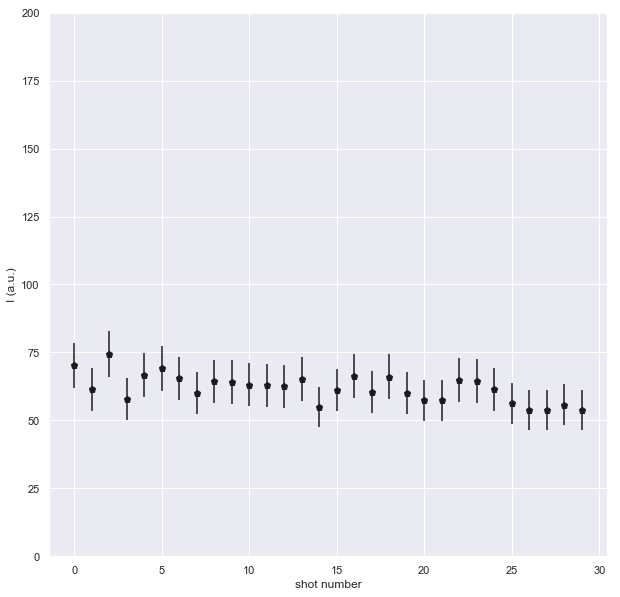

In [112]:
files = glob.glob(LIVE['LIVE03_250_170-200']+'/*.jpg')
sfiles = sort_files(files)
L03DF7 = load_LIVE_images(sfiles)
plot_LIVE_images(L03DF7, nx=6, ny=5, figsize=(14,14))
plot_avg_intensity(L03DF7, imax=200, figsize=(10,10))

 average intensity per pixel = 61.87041422526042 +- 5.0689150713228885


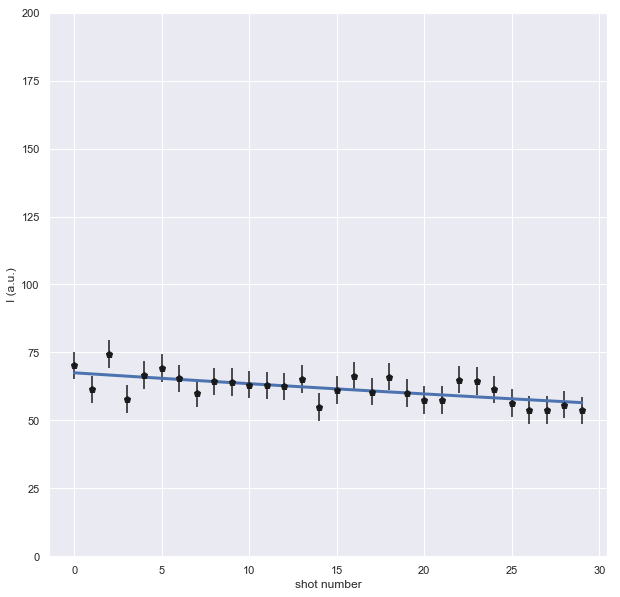

Fit function -->FitFunction(fn=<function fit.<locals>.<lambda> at 0x1a19aa4620>, values=array([  67.51033262, -163.60895075]), errors=array([ 1.88126758, 46.34936185]), chi2=0.6212232226783899, pvalue=0.9403900898249116, cov=array([[   3.53916771,   73.61105093],
       [  73.61105093, 2148.2633437 ]]))


In [116]:
avg_l03df7 = np.mean(avg_intensity(L03DF7))
std_l03df7 = np.std(avg_intensity(L03DF7))
print(f' average intensity per pixel = {avg_l03df7} +- {std_l03df7}')

I = avg_intensity(L03DF7)
X = np.arange(len(I))
seed = expo_seed(X, I)
f    = fitf.fit(fitf.expo, X, I, seed, sigma= std_l03df7 * np.ones(len(I)))

imax=200
figsize=(10,10)
fig = plt.figure(figsize=figsize)
plt.errorbar(X,I, fmt="kp", yerr= std_l03df7  * np.ones(len(I)), ms=7, ls='none')
plt.plot(X, f.fn(X), lw=3)
plt.ylim(0,imax)
plt.xlabel('shot number')
plt.ylabel('I (a.u.)')
plt.show()
print(f'Fit function -->{f}')

In [114]:
L03DFa = L03DF1 + L03DF2 + L03DF3 + L03DF4 
L03DFb = L03DF5 + L03DF6 + L03DF7

 average intensity per pixel = 91.84088414510092 +- 20.034354368450458
 take std error as average of errors = 9.929387778760224


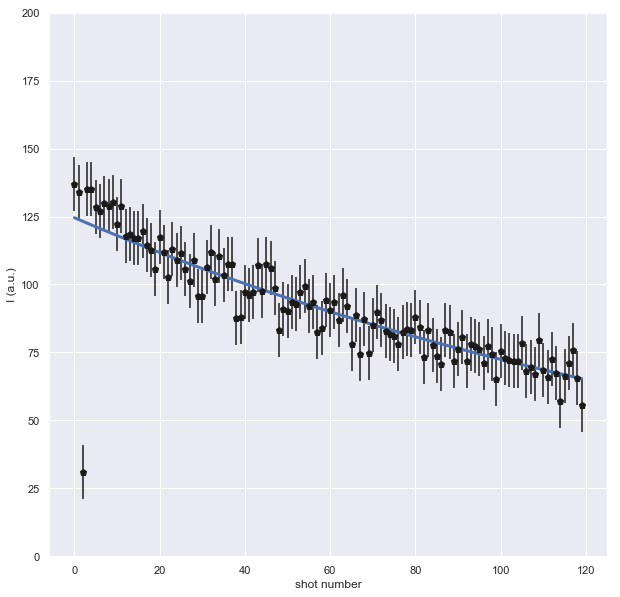

Fit function -->FitFunction(fn=<function fit.<locals>.<lambda> at 0x1a18b6e158>, values=array([ 124.571553  , -184.53473376]), errors=array([2.08855585, 9.93882809]), chi2=1.1053751861743728, pvalue=0.20450239618934926, cov=array([[ 4.36206553, 16.92936236],
       [16.92936236, 98.78030374]]))


In [126]:
avg_l03dfa = np.mean(avg_intensity(L03DFa))
std_l03dfa = np.std(avg_intensity(L03DFa))
print(f' average intensity per pixel = {avg_l03dfa} +- {std_l03dfa}')

I = avg_intensity(L03DFa)
X = np.arange(len(I))
seed = expo_seed(X, I)

sigma = np.mean([std_l03df1, std_l03df2, std_l03df3, std_l03df4]) 

print(f' take std error as average of errors = {sigma}')


f    = fitf.fit(fitf.expo, X, I, seed, sigma= sigma * np.ones(len(I)))

imax=200
figsize=(10,10)
fig = plt.figure(figsize=figsize)
plt.errorbar(X,I, fmt="kp", yerr= sigma  * np.ones(len(I)), ms=7, ls='none')
plt.plot(X, f.fn(X), lw=3)
plt.ylim(0,imax)
plt.xlabel('shot number')
plt.ylabel('I (a.u.)')
plt.show()
print(f'Fit function -->{f}')

### First four shots are consistent with a constant photobleaching slope.

 average intensity per pixel = 64.39051513671875 +- 5.169500332475465
 take std error as average of errors = 4.6684631463920025


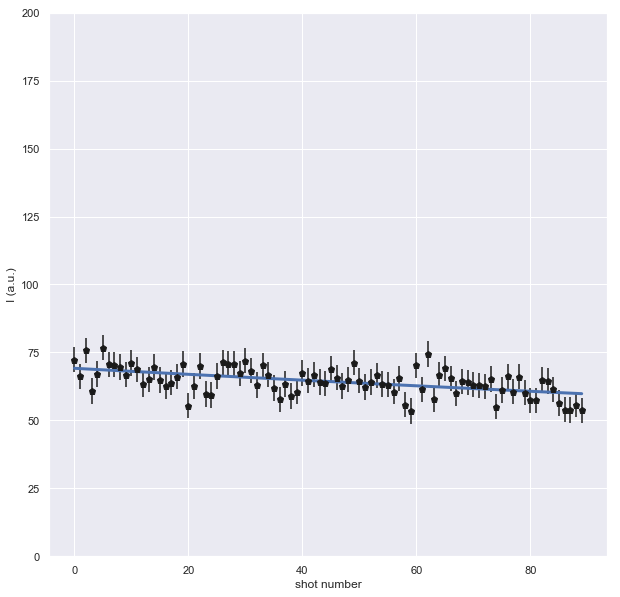

Fit function -->FitFunction(fn=<function fit.<locals>.<lambda> at 0x1a18b6e950>, values=array([  69.17028941, -613.83454195]), errors=array([  1.01083725, 110.98348614]), chi2=0.9035428047466944, pvalue=0.7293814281079167, cov=array([[1.02179194e+00, 9.56550804e+01],
       [9.56550804e+01, 1.23173342e+04]]))


In [127]:
avg_l03dfb = np.mean(avg_intensity(L03DFb))
std_l03dfb = np.std(avg_intensity(L03DFb))
print(f' average intensity per pixel = {avg_l03dfb} +- {std_l03dfb}')

I = avg_intensity(L03DFb)
X = np.arange(len(I))
seed = expo_seed(X, I)

sigma = np.mean([std_l03df5, std_l03df6, std_l03df7]) 

print(f' take std error as average of errors = {sigma}')


f    = fitf.fit(fitf.expo, X, I, seed, sigma= sigma * np.ones(len(I)))

imax=200
figsize=(10,10)
fig = plt.figure(figsize=figsize)
plt.errorbar(X,I, fmt="kp", yerr= sigma  * np.ones(len(I)), ms=7, ls='none')
plt.plot(X, f.fn(X), lw=3)
plt.ylim(0,imax)
plt.xlabel('shot number')
plt.ylabel('I (a.u.)')
plt.show()
print(f'Fit function -->{f}')

### Last 3 shots are consistent with a flatter "almost no PB" slope. 

In [128]:
def fit_and_plot(X, I, si, sf,sigma0 = 5):
    seed = expo_seed(X[si:sf], I[si:sf])
    f    = fitf.fit(fitf.expo, X[si:sf], I[si:sf], seed, sigma = sigma0 * np.ones(sf - si))
    plt.plot(X[si:sf], f.fn(X[si:sf]), lw=3)
    return f

    

## Theoretical


        Pulsed Laser:
        wavelength                =8.0e+02 nm
        photon energy             =1.6e+00 eV
        power                     =1.5e+02 mW
        repetition rate           =7.6e+01 kHz
        pulse width               =4.0e+02 fs
        energy per pulse          =1.1e+04 fJ
        energy per second         =1.5e+02 mJ
        photons per second        =6.0e+17 ph/second
        

        name                 = JMB
        NA                   =   0.5
        M                    =  20.0
        eff dichroic         =  0.70
        eff filter           =  1.00
        eff PMT              =  0.10
        Optical transmission =  0.96
        Filter  transmission =  0.70
        Total transmission   =  0.07
        

        w0                   =   0.5 micron
        zr                   =   1.0 micron
        DOF                  =   2.0 micron
        
 Diffraction limit transverse size of beam = 0.9760000000000002
pixel size = 3.5e-01 mum
time per pixel =97.6

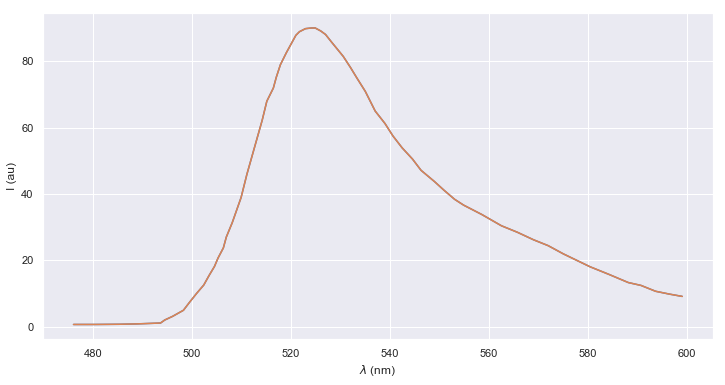

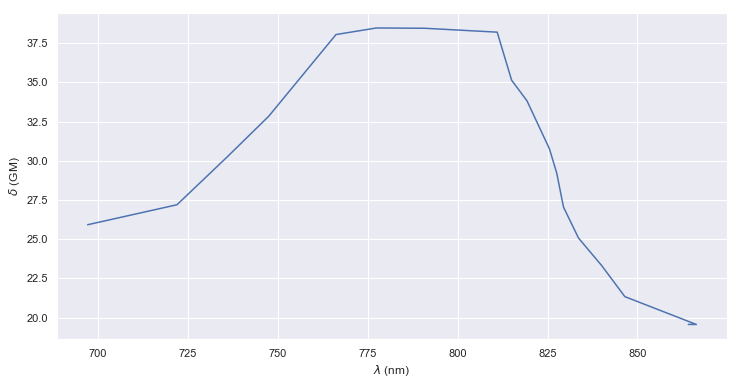

In [297]:
s2 = Setup(            setup_name             = 'Espinardo',
                        molecule_name          = 'FLUO3',
                        sample_name            = '5ba',
                        sample_concentration   = 1E+6/6 * nanomole/liter,
                        laser_lambda           = 800 * nm,
                        laser_power            = 250 * mW,
                        laser_eff              = 0.6,
                        laser_lambda_eff       = 1,
                        laser_f                = 76  * megahertz,
                        laser_tau              = 400 * femtosecond,
                        mc_name                = 'JMB',
                        mc_NA                  = 0.5,
                        mc_M                   = 20,
                        mc_eff_dic             = 0.7,
                        mc_eff_filt            = 1.0,
                        mc_eff_PMT             = 0.1,
                        n_pixels               = 256,
                        scan_length            = 90 * mum,
                        v_per_line             = 40)

In [302]:
avg_l03df = 124.6
F = s2.fluorescence()
nf = s2.photons_per_pixel()
pnm = s2.photons_per_pixel_per_molecule()
nd = s2.detected_photons_per_pixel()
IN = nd / avg_l03df
print(f' F = {F/us:5.1e}  photons/second')
print(f' nf = {nf:5.1e} photons/pixel (about 100 mus)')
print(f' nm = {pnm:5.1e} photons/pixel/molecule (about 100 mus)')
print(f' nd = {nd:5.1e} detected photons/pixel (about 100 mus)')
print(f' number of photons per count = {IN:5.1e} ')

 F = 1.9e+20  photons/second
 nf = 1.9e+16 photons/pixel (about 100 mus)
 nm = 5.3e-14 photons/pixel/molecule (about 100 mus)
 nd = 1.2e+15 detected photons/pixel (about 100 mus)
 number of photons per count = 1.0e+13 


### LIVE04 --- 750mW

In [131]:
LIVE.keys()

dict_keys(['LIVE03_250_110-140', 'LIVE02_100_13;15', 'LIVE03_250_140-170', 'LIVE03_250_80-110', 'LIVE04_750_31-60', 'LIVE03_250_170-200', 'LIVE03_250_1-25', 'LIVE04_750_1-30', 'LIVE03_250_25-50', 'LIVE02_100_13;21', 'LIVE02_100_13;19', 'LIVE02_100_13;26', 'LIVE02_100_13;17', 'LIVE04_750_61-90', 'LIVE03_250_50-80'])

Loading files corresponding to shots ['shot1', 'shot2', 'shot3', 'shot4', 'shot5', 'shot6', 'shot7', 'shot8', 'shot9', 'shot10', 'shot11', 'shot12', 'shot13', 'shot14', 'shot15', 'shot16', 'shot17', 'shot18', 'shot19', 'shot20', 'shot21', 'shot22', 'shot23', 'shot24', 'shot25', 'shot26', 'shot27', 'shot28', 'shot29', 'shot30']


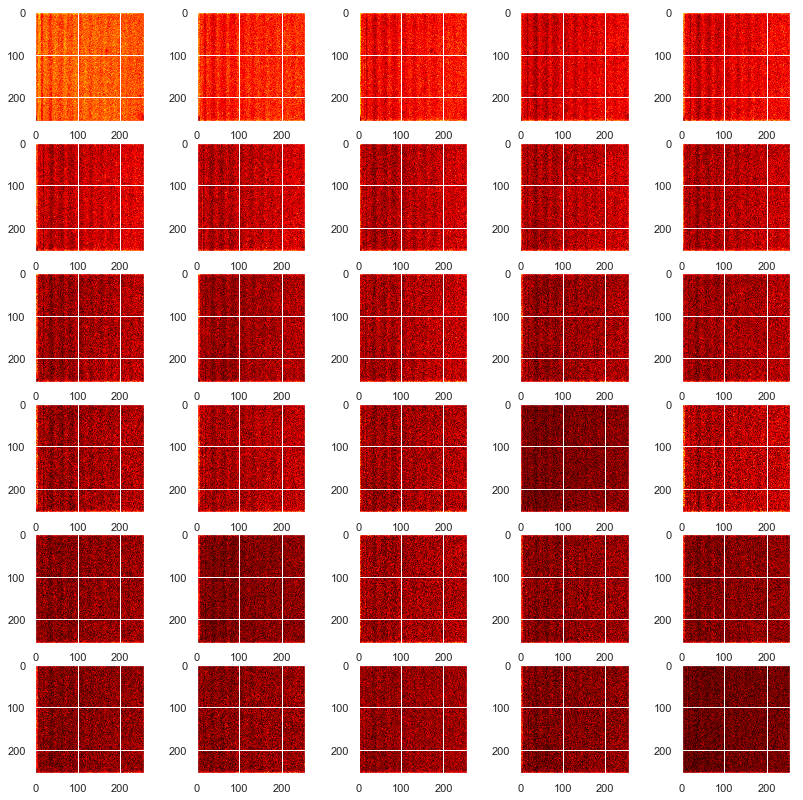

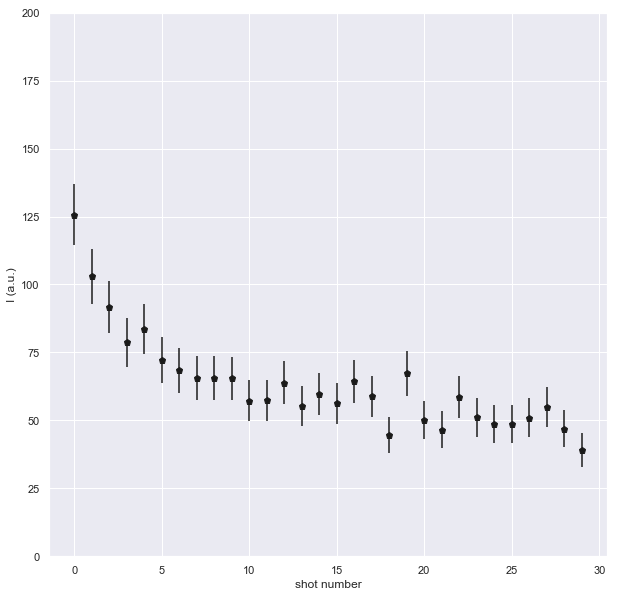

In [137]:
files = glob.glob(LIVE['LIVE04_750_1-30']+'/*.jpg')
sfiles = sort_files(files)
L04DF1 = load_LIVE_images(sfiles)
plot_LIVE_images(L04DF1, nx=6, ny=5, figsize=(14,14))
plot_avg_intensity(L04DF1, imax=200, figsize=(10,10))

Loading files corresponding to shots ['shot1', 'shot2', 'shot3', 'shot4', 'shot5', 'shot6', 'shot7', 'shot8', 'shot9', 'shot10', 'shot11', 'shot12', 'shot13', 'shot14', 'shot15', 'shot16', 'shot17', 'shot18', 'shot19', 'shot20', 'shot21', 'shot22', 'shot23', 'shot24', 'shot25', 'shot26', 'shot27', 'shot28', 'shot29', 'shot30']


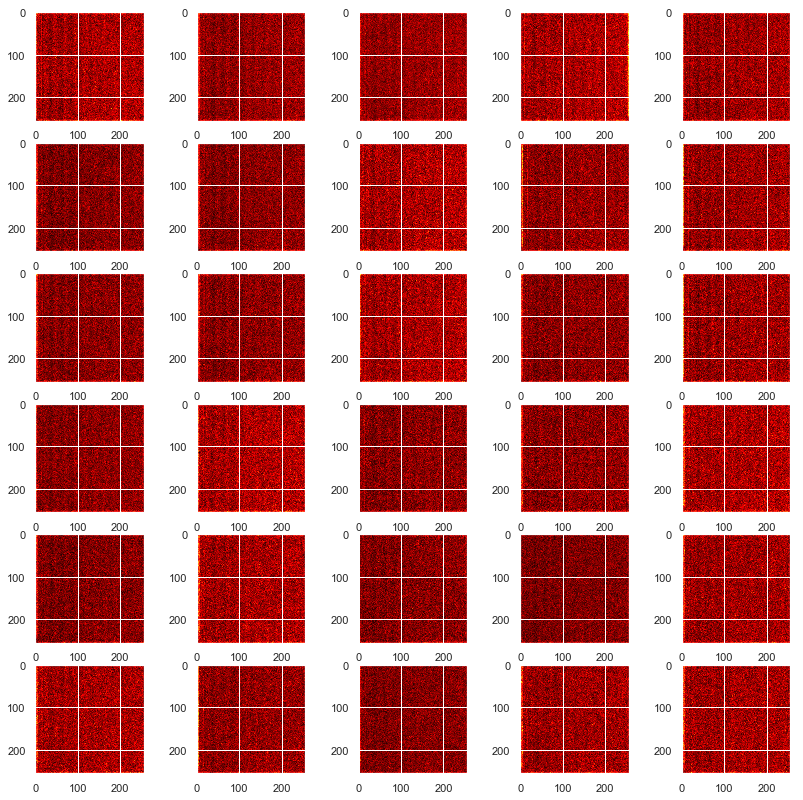

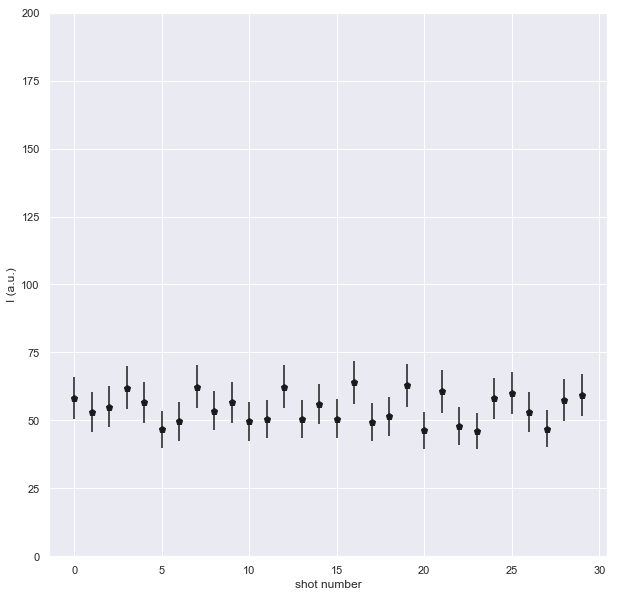

In [138]:
files = glob.glob(LIVE['LIVE04_750_31-60']+'/*.jpg')
sfiles = sort_files(files)
L04DF2 = load_LIVE_images(sfiles)
plot_LIVE_images(L04DF2, nx=6, ny=5, figsize=(14,14))
plot_avg_intensity(L04DF2, imax=200, figsize=(10,10))

Loading files corresponding to shots ['shot1', 'shot2', 'shot3', 'shot4', 'shot5', 'shot6', 'shot7', 'shot8', 'shot9', 'shot10', 'shot11', 'shot12', 'shot13', 'shot14', 'shot15', 'shot16', 'shot17', 'shot18', 'shot19', 'shot20', 'shot21', 'shot22', 'shot23', 'shot24', 'shot25', 'shot26', 'shot27', 'shot28', 'shot29', 'shot30']


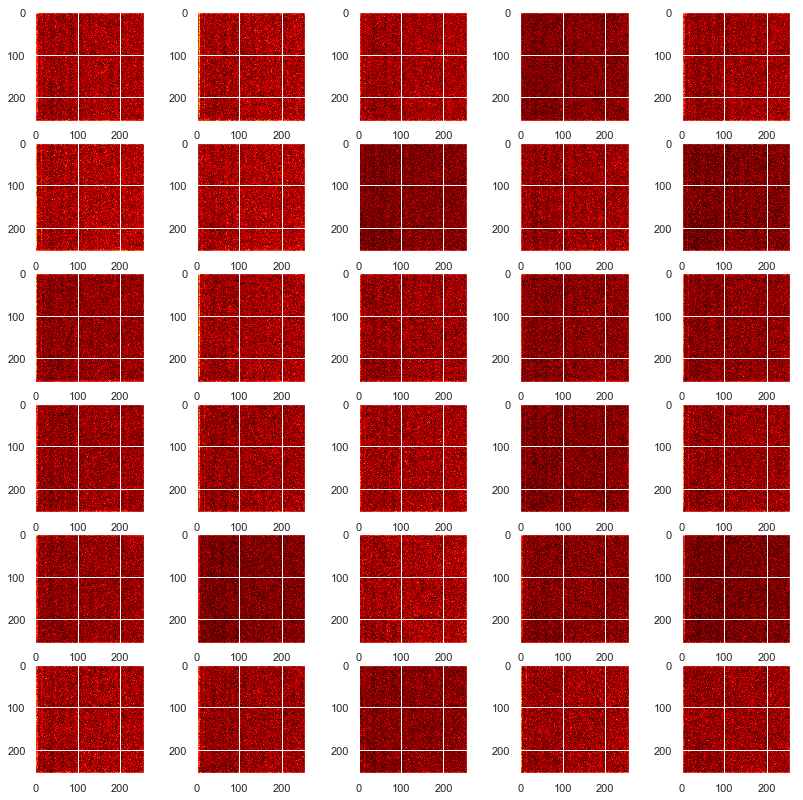

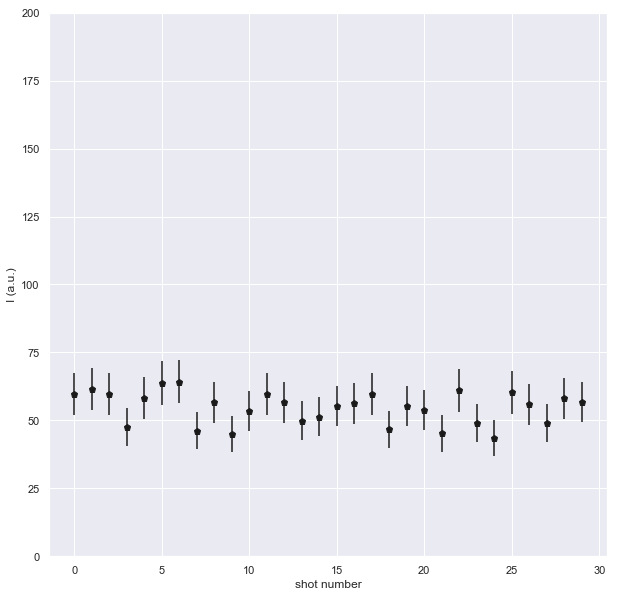

In [139]:
files = glob.glob(LIVE['LIVE04_750_61-90']+'/*.jpg')
sfiles = sort_files(files)
L04DF3 = load_LIVE_images(sfiles)
plot_LIVE_images(L04DF3, nx=6, ny=5, figsize=(14,14))
plot_avg_intensity(L04DF3, imax=200, figsize=(10,10))

In [140]:
L04DF = L04DF1 + L04DF2 + L04DF3

First exponential ->FitFunction(fn=<function fit.<locals>.<lambda> at 0x1a1997f7b8>, values=array([113.37584448, -12.87078349]), errors=array([3.34736811, 1.15261378]), chi2=2.2077920739977803, pvalue=0.02390547413233853, cov=array([[11.20487325,  2.97059861],
       [ 2.97059861,  1.32851852]]))
Second exponential ->FitFunction(fn=<function fit.<locals>.<lambda> at 0x109f5cbf8>, values=array([5.44840890e+01, 1.06564661e+09]), errors=array([1.29331165e+00, 2.55101283e+14]), chi2=1.5091928135979567, pvalue=0.0024707357919905746, cov=array([[1.67265504e+00, 2.97513623e+14],
       [2.97513623e+14, 6.50766644e+28]]))


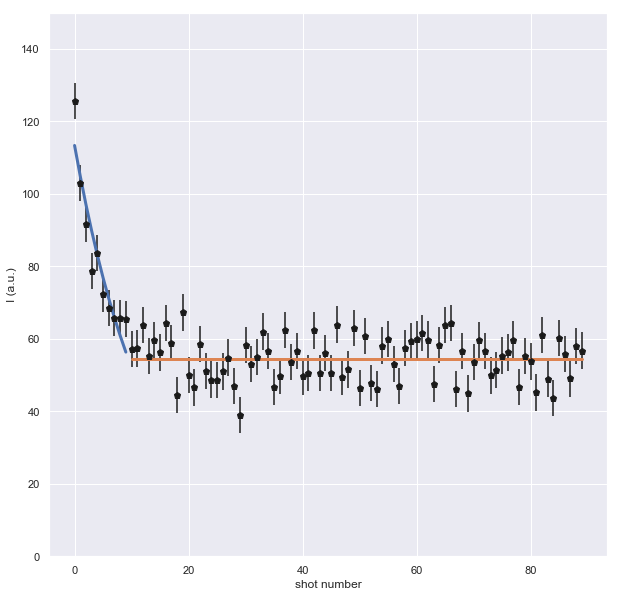

In [141]:
imax = 150
figsize=(10,10)
fig = plt.figure(figsize=figsize)
plt.errorbar(X,I, fmt="kp", yerr=5* np.ones(len(I)), ms=7, ls='none')

I = avg_intensity(L04DF)
X = np.arange(len(I))

si = 0
sf = 10 

f = fit_and_plot(X, I, si, sf)
print(f'First exponential ->{f}')

si = 10
sf = 90 
f = fit_and_plot(X, I, si, sf)
print(f'Second exponential ->{f}')

plt.ylim(0,imax)
plt.xlabel('shot number')
plt.ylabel('I (a.u.)')
plt.show()


 average intensity per pixel = 99.78903579711914 +- 17.281613996256684
 take std error as  = 5


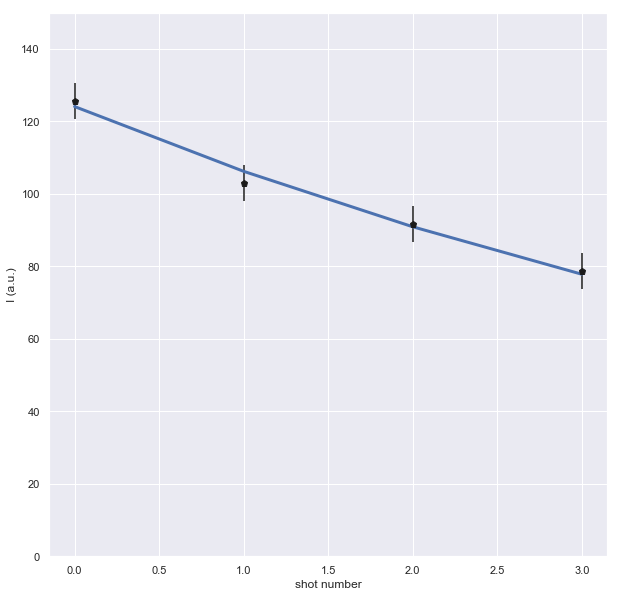

Fit function -->FitFunction(fn=<function fit.<locals>.<lambda> at 0x1a192f5d90>, values=array([124.10323702,  -6.43010058]), errors=array([4.43031213, 0.95058779]), chi2=0.27845043662388724, pvalue=0.7569557841044081, cov=array([[19.62766559,  3.04176266],
       [ 3.04176266,  0.90361715]]))


In [147]:
si = 0
sf = 4 
avg_l04dfa = np.mean(avg_intensity(L04DF1[si:sf]))
std_l04dfa = np.std(avg_intensity(L03DF1[si:sf]))
print(f' average intensity per pixel = {avg_l04dfa} +- {std_l04dfa}')

I = avg_intensity(L04DF1[si:sf])
X = np.arange(len(I))
seed = expo_seed(X, I)

sigma = 5

print(f' take std error as  = {sigma}')

f    = fitf.fit(fitf.expo, X, I, seed, sigma= sigma * np.ones(len(I)))

imax=150
figsize=(10,10)
fig = plt.figure(figsize=figsize)
plt.errorbar(X,I, fmt="kp", yerr= sigma  * np.ones(len(I)), ms=7, ls='none')
plt.plot(X, f.fn(X), lw=3)
plt.ylim(0,imax)
plt.xlabel('shot number')
plt.ylabel('I (a.u.)')
plt.show()
print(f'Fit function -->{f}')

 average intensity per pixel = 57.764425424429085 +- 9.723004950763853
 take std error as  = 5


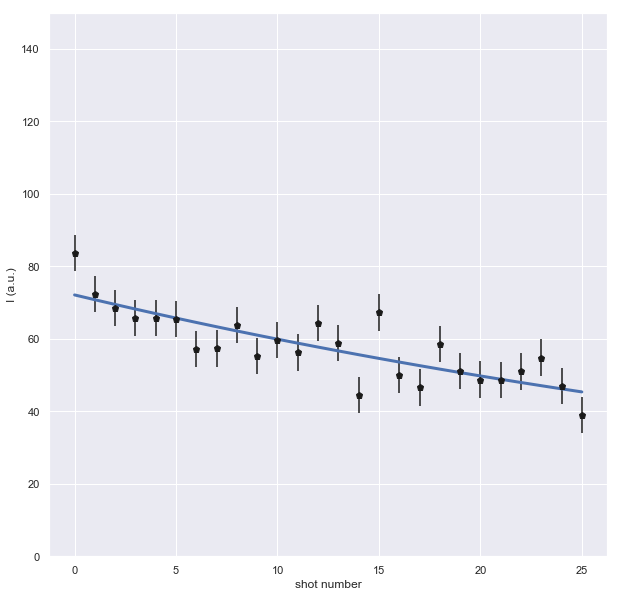

Fit function -->FitFunction(fn=<function fit.<locals>.<lambda> at 0x1a18a87f28>, values=array([ 72.12413121, -53.91364353]), errors=array([2.11159637, 6.66890805]), chi2=1.3622204344321884, pvalue=0.11071218164229453, cov=array([[ 4.45883923, 11.52705326],
       [11.52705326, 44.47433459]]))


In [151]:
si = 4
sf = 30 
avg_l04dfa = np.mean(avg_intensity(L04DF1[si:sf]))
std_l04dfa = np.std(avg_intensity(L03DF1[si:sf]))
print(f' average intensity per pixel = {avg_l04dfa} +- {std_l04dfa}')

I = avg_intensity(L04DF1[si:sf])
X = np.arange(len(I))
seed = expo_seed(X, I)

sigma = 5

print(f' take std error as  = {sigma}')

f    = fitf.fit(fitf.expo, X, I, seed, sigma= sigma * np.ones(len(I)))

imax=150
figsize=(10,10)
fig = plt.figure(figsize=figsize)
plt.errorbar(X,I, fmt="kp", yerr= sigma  * np.ones(len(I)), ms=7, ls='none')
plt.plot(X, f.fn(X), lw=3)
plt.ylim(0,imax)
plt.xlabel('shot number')
plt.ylabel('I (a.u.)')
plt.show()
print(f'Fit function -->{f}')

In [152]:
L04DFb = L04DF2 + L04DF3

 average intensity per pixel = 54.63720957438151 +- 5.693489047233403
 take std error as  = 5.693489047233403


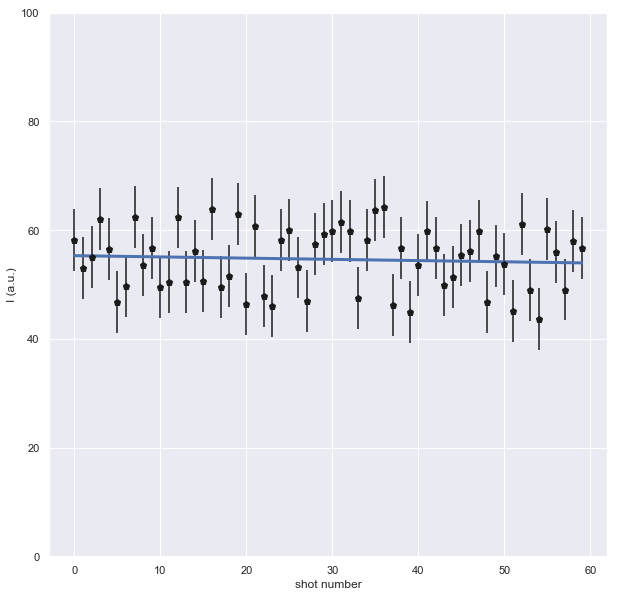

Fit function -->FitFunction(fn=<function fit.<locals>.<lambda> at 0x1a199b20d0>, values=array([   55.30364791, -2428.17322947]), errors=array([1.46046184e+00, 4.58028088e+03]), chi2=1.0296157756278599, pvalue=0.413038289312481, cov=array([[2.13294879e+00, 5.75632775e+03],
       [5.75632775e+03, 2.09789730e+07]]))


In [154]:
avg_l04dfb = np.mean(avg_intensity(L04DFb))
std_l04dfb = np.std(avg_intensity(L04DFb))
print(f' average intensity per pixel = {avg_l04dfb} +- {std_l04dfb}')

I = avg_intensity(L04DFb)
X = np.arange(len(I))
seed = expo_seed(X, I)

sigma = std_l04dfb

print(f' take std error as  = {sigma}')


f    = fitf.fit(fitf.expo, X, I, seed, sigma= sigma * np.ones(len(I)))

imax=100
figsize=(10,10)
fig = plt.figure(figsize=figsize)
plt.errorbar(X,I, fmt="kp", yerr= sigma  * np.ones(len(I)), ms=7, ls='none')
plt.plot(X, f.fn(X), lw=3)
plt.ylim(0,imax)
plt.xlabel('shot number')
plt.ylabel('I (a.u.)')
plt.show()
print(f'Fit function -->{f}')

### Analysis 


        Pulsed Laser:
        wavelength                =8.0e+02 nm
        photon energy             =1.6e+00 eV
        power                     =4.5e+02 mW
        repetition rate           =7.6e+01 kHz
        pulse width               =4.0e+02 fs
        energy per pulse          =3.4e+04 fJ
        energy per second         =4.5e+02 mJ
        photons per second        =1.8e+18 ph/second
        

        name                 = JMB
        NA                   =   0.5
        M                    =  20.0
        eff dichroic         =  0.70
        eff filter           =  1.00
        eff PMT              =  0.10
        Optical transmission =  0.96
        Filter  transmission =  0.70
        Total transmission   =  0.07
        

        w0                   =   0.5 micron
        zr                   =   1.0 micron
        DOF                  =   2.0 micron
        
 Diffraction limit transverse size of beam = 0.9760000000000002
pixel size = 3.5e-01 mum
time per pixel =97.6

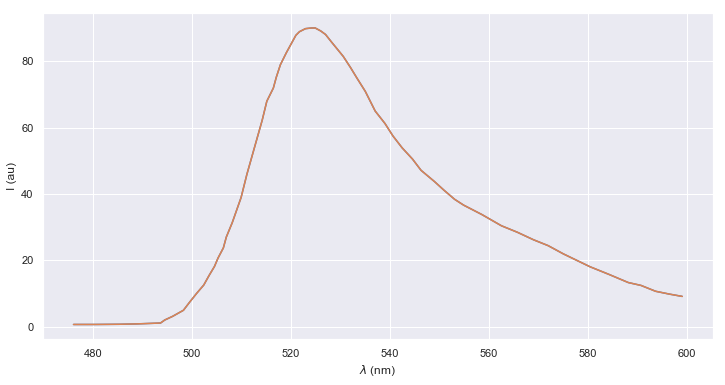

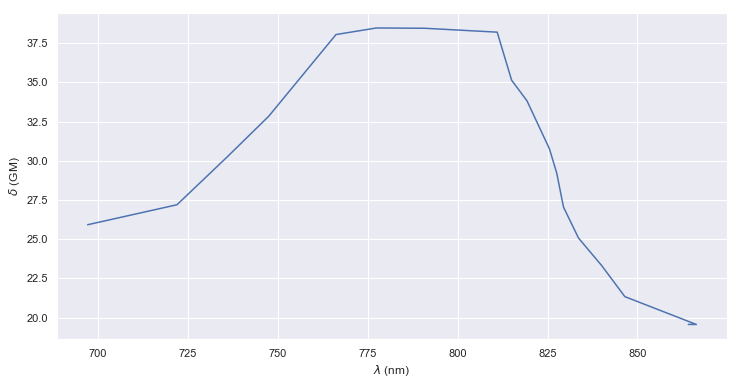

In [305]:
s2 = Setup(            setup_name             = 'Espinardo',
                        molecule_name          = 'FLUO3',
                        sample_name            = '5ba',
                        sample_concentration   = 1E+6/6 * nanomole/liter,
                        laser_lambda           = 800 * nm,
                        laser_power            = 750 * mW,
                        laser_eff              = 0.6,
                        laser_lambda_eff       = 1,
                        laser_f                = 76  * megahertz,
                        laser_tau              = 400 * femtosecond,
                        mc_name                = 'JMB',
                        mc_NA                  = 0.5,
                        mc_M                   = 20,
                        mc_eff_dic             = 0.7,
                        mc_eff_filt            = 1.0,
                        mc_eff_PMT             = 0.1,
                        n_pixels               = 256,
                        scan_length            = 90 * mum,
                        v_per_line             = 40)

In [306]:
avg_l04df = 125.6
F = s2.fluorescence()
nf = s2.photons_per_pixel()
pnm = s2.photons_per_pixel_per_molecule()
nd = s2.detected_photons_per_pixel()
IN = nd / avg_l03df
print(f' F = {F/us:5.1e}  photons/second')
print(f' nf = {nf:5.1e} photons/pixel (about 100 mus)')
print(f' nm = {pnm:5.1e} photons/pixel/molecule (about 100 mus)')
print(f' nd = {nd:5.1e} detected photons/pixel (about 100 mus)')
print(f' number of photons per count = {IN:5.1e} ')

 F = 2.0e+12  photons/second
 nf = 1.9e+08 photons/pixel (about 100 mus)
 nm = 1.2e+03 photons/pixel/molecule (about 100 mus)
 nd = 1.3e+07 detected photons/pixel (about 100 mus)
 number of photons per count = 1.0e+05 


## Summary

- Intensity at 750 mW and at 250 mW is the same (saturation??!!) but decays quicker at 750 mW, PB.
- There seems to be a bit of PB already at 100 mW, this is strange, since the number of photons per molecule is not large enough to kill individual molecules. Saturation, self-emission?